# Cryptonians #
_**Project Group 2**_

---
## Contents

1. [Data](#Data)  

   1.1 [Load](#Load)  
   
   1.2 [Overview](#Overview)
   
   1.3 [Transformation](#Transformation) 
   
         1.3.1  [Entire Time Series Summaries, Aggregated by Day](#13df_daily)
         
         1.3.2  [Percentage Changes, Aggregated by Day](#13df_deltas)
         
         1.3.3  [Rolling Averages and Standard Deviations, Aggregated by Day](#13df_rolling)
         
   1.4 [Feature Exploration](#Overview)
   
   
2. [Training](#Training)

   2.1 [RCF modelling with the df_daily datraframe](#21df_daily)
   
   2.2 [RCF modelling with the df_deltas datraframe](#22df_deltas)
   
   2.2 [RCF modelling with the df_rolling datraframe](#23df_rolling)
   
3. [Comparison of Model Results and Mixing Models] (#Comparison of Model Results and Mixing Models)
   
   
4. [Summary](#Summary)



# 1. Data  

The data was sourced from Kaggle and represents the Open, High, Low and Close price and Volume of trading between Bitcoin and USD on the Bitstamp cryptocurrency exchange, which ranks 20th in market share among cryptocurrency exchanges as of October 11, 2018. Data range from January 1, 2012, to June 27, 2018.



## 1.1  Load

We need to load python packages for manipulating dataframes and features, plotting our features and model results, and accessing AWS resources.

In [59]:
import boto3
import botocore
import sagemaker
from sagemaker import RandomCutForest
from sagemaker.predictor import csv_serializer, json_deserializer
import sys
import pandas as pd
import io
from datetime import datetime
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from datetime import timedelta 
import matplotlib.dates as mdates

# Until we figure out S3 access, we will need to change to our own S3 and prefix.
bucket = 'sagemaker-davidrob'
prefix = 'group-project/bitcoin'
# @David, please change prefix to 'minute' to save your data
# prefix = 'minute'
filename = 'bitstampUSD_1-min_data_2012-01-01_to_2018-06-27-orig.csv'

############################## KEYS ############################
# @All, please use the accessKeys.csv sent in the email to fill the keys, make sure we don't publish note book with keys to Github.
# AWS will remove key sets from account.
access_key_id='INSERT_HERE'
secret_access_key='INSERT_HERE'
################################################################

execution_role = sagemaker.get_execution_role()

# check if the bucket exists
try:
    boto3.Session().client('s3').head_bucket(Bucket=bucket)
except botocore.exceptions.ParamValidationError as e:
    print('Hey! You either forgot to specify your S3 bucket'
          ' or you gave your bucket an invalid name!')
except botocore.exceptions.ClientError as e:
    if e.response['Error']['Code'] == '403':
        print("Hey! You don't have permission to access the bucket, {}.".format(bucket))
    elif e.response['Error']['Code'] == '404':
        print("Hey! Your bucket, {}, doesn't exist!".format(bucket))
    else:
        raise
else:
    print('Training input/output will be stored in: s3://{}/{}'.format(bucket, prefix))

Training input/output will be stored in: s3://sagemaker-davidrob/group-project/bitcoin


In [3]:
# Step 1.1: get the bitcoin minute-by-minute data from kaggle
# https://www.kaggle.com/mczielinski/bitcoin-historical-data#bitstampUSD_1-min_data_2012-01-01_to_2018-06-27.csv

#!pip install kaggle
#!kaggle datasets download -d mczielinski/bitcoin-historical-data
#!mkdir bitcoin-historical-data
#!mv bitcoin-historical-data.zip /bitcoin-historical-data
#!unzip -a /bitcoin-historical-data/bitcoin-historical-data.zip
#df = pd.read_csv('bitstampUSD_1-min_data_2012-01-01_to_2018-06-27.csv', encoding="ISO-8859-1", low_memory=False)

#s3 = boto3.client('s3')
#raw_data = s3.get_object(Bucket=bucket, Key=f'group-project/bitcoin/bitstampUSD_1-min_data_2012-01-01_to_2018-06-27.csv')
#df = pd.read_csv('~/SageMaker/bitstampUSD_1-min_data_2012-01-01_to_2018-06-27.csv', encoding="ISO-8859-1", low_memory=False)

s3 = boto3.client('s3')
raw_data = s3.get_object(Bucket=bucket, Key=f'group-project/bitcoin/bitstampUSD_1-min_data_2012-01-01_to_2018-06-27.csv')
df = pd.read_csv(io.BytesIO(raw_data['Body'].read()), encoding="ISO-8859-1", low_memory=False)

## 1.2  Explore

The features contained in our starting data set include the following values in minute-by-minute slices:  

Open: The price at the beginning of the time period.
High: The maximum price during the time period.
Low:  The minimum price during the time period.
Close:  The price at the end of the time period.
Volume_(BTC):  The volume of Bitcoin transacted on the exchange during the time period.  This is represented in fractional Bitcoin units to the nearest 1/100,000.
Volume_(Currency):  The volume of USD transacted on the exchange during the time period.
Weighted_Price:  The volume-weighted average price during the time period.

In [4]:
df.head()

,Timestamp,Open,High,Low,Close,Volume_(BTC),Volume_(Currency),Weighted_Price
0,1325317920,4.39,4.39,4.39,4.39,0.455581,2.0,4.39
1,1325317980,4.39,4.39,4.39,4.39,0.455581,2.0,4.39
2,1325318040,4.39,4.39,4.39,4.39,0.455581,2.0,4.39
3,1325318100,4.39,4.39,4.39,4.39,0.455581,2.0,4.39
4,1325318160,4.39,4.39,4.39,4.39,0.455581,2.0,4.39


## 1.3  Transformation
Remove records with missing data.

Add time groupings to roll up by hours and days.

Create three datasets with generated features focusing on: 
* overall summary statistics, 
* various delta calculations and 
* rolling average and standard deviations


#### Remove Missing Values

In [5]:
# Remove NA
df = df.dropna(how='any')

#### Date time feature generation

We bread out time units by minute, hour and day for the purpose of rolling up market measures to larger time units.

In [6]:
# Step 1.3a: Add day and hour data elements to the dataframe so we can group by days and hours in later analysis

# create various date formats for grouping later on
df['Time'] = pd.to_datetime(df['Timestamp'], unit = 's', infer_datetime_format = 'True')
df['Date'] = df['Time'].values.astype('datetime64[D]')
df['Hour'] = df['Time'].values.astype('datetime64[h]')
df['Minute'] = df['Time'].values.astype('datetime64[m]')

df = df.drop(columns=['Timestamp'])

# reality check - make sure the dataframe looks right so far.
df.head()

,Open,High,Low,Close,Volume_(BTC),Volume_(Currency),Weighted_Price,Time,Date,Hour,Minute
0,4.39,4.39,4.39,4.39,0.455581,2.0,4.39,2011-12-31 07:52:00,2011-12-31,2011-12-31 07:00:00,2011-12-31 07:52:00
1,4.39,4.39,4.39,4.39,0.455581,2.0,4.39,2011-12-31 07:53:00,2011-12-31,2011-12-31 07:00:00,2011-12-31 07:53:00
2,4.39,4.39,4.39,4.39,0.455581,2.0,4.39,2011-12-31 07:54:00,2011-12-31,2011-12-31 07:00:00,2011-12-31 07:54:00
3,4.39,4.39,4.39,4.39,0.455581,2.0,4.39,2011-12-31 07:55:00,2011-12-31,2011-12-31 07:00:00,2011-12-31 07:55:00
4,4.39,4.39,4.39,4.39,0.455581,2.0,4.39,2011-12-31 07:56:00,2011-12-31,2011-12-31 07:00:00,2011-12-31 07:56:00


In [25]:
df.describe()

,Open,High,Low,Close,Volume_(BTC),Volume_(Currency),Weighted_Price
count,3.405857e+06,3.405857e+06,3.405857e+06,3.405857e+06,3.405857e+06,3.405857e+06,3.405857e+06
mean,1.535757e+03,1.537163e+03,1.534153e+03,1.535739e+03,1.101862e+01,1.533527e+04,1.535645e+03
std,3.037551e+03,3.041014e+03,3.033519e+03,3.037511e+03,3.500616e+01,7.259934e+04,3.037272e+03
min,3.800000e+00,3.800000e+00,1.500000e+00,1.500000e+00,0.000000e+00,0.000000e+00,3.800000e+00
25%,1.228200e+02,1.228900e+02,1.227600e+02,1.228100e+02,4.767414e-01,7.732200e+01,1.228200e+02
50%,4.167300e+02,4.168700e+02,4.165600e+02,4.167200e+02,2.157220e+00,4.738905e+02,4.167000e+02
75%,8.094000e+02,8.099700e+02,8.089900e+02,8.094800e+02,8.931947e+00,4.197468e+03,8.093700e+02
max,1.966576e+04,1.966600e+04,1.964996e+04,1.966575e+04,5.853852e+03,5.483271e+06,1.966330e+04


#### Normalization

Not surprisingly, our price descriptions all function on a similar scale because they describe the same value at different moments in time.  Volume of Bitcoin is approximately 1 order of magnitude smaller than the price indicators, however, and volume of USD is 3 orders of magnitude larger than the volume of Bitcoin. It makes sense that USD is traded at a higher volume than Bitcoin, because it can be used to trade in all the cryptocurrencies offered on the Bitstamp exchange.

The following two dataframes normalize the data. First using the mean and standard deviation:
(normalized_feature=(feature-feature.mean())/feature.std()

and second using the min and max:
normalized_feature=(feature-feature.min())/(feature.max()-feature.min())

We will compare the un-normalized data to the two normalized data sets and decide which one to use during the remainder of the analysis.

In [20]:
# mean_normalization
df_mean_normalized = df.copy()
df_mean_normalized['Open'] = (df_mean_normalized['Open']-df_mean_normalized['Open'].mean())/df_mean_normalized['Open'].std()
df_mean_normalized['High'] = (df_mean_normalized['High']-df_mean_normalized['High'].mean())/df_mean_normalized['High'].std()
df_mean_normalized['Low'] = (df_mean_normalized['Low']-df_mean_normalized['Low'].mean())/df_mean_normalized['Low'].std()
df_mean_normalized['Close'] = (df_mean_normalized['Close']-df_mean_normalized['Close'].mean())/df_mean_normalized['Close'].std()
df_mean_normalized['Volume_(BTC)'] = (df_mean_normalized['Volume_(BTC)']-df_mean_normalized['Volume_(BTC)'].mean())/df_mean_normalized['Volume_(BTC)'].std()
df_mean_normalized['Volume_(Currency)'] = (df_mean_normalized['Volume_(Currency)']-df_mean_normalized['Volume_(Currency)'].mean())/df_mean_normalized['Volume_(Currency)'].std()
df_mean_normalized['Weighted_Price'] = (df_mean_normalized['Weighted_Price']-df_mean_normalized['Weighted_Price'].mean())/df_mean_normalized['Weighted_Price'].std()

df_mean_normalized.head()

,Open,High,Low,Close,Volume_(BTC),Volume_(Currency),Weighted_Price,Time,Date,Hour,Minute
0,-0.504145,-0.504034,-0.504287,-0.504146,-0.301748,-0.211204,-0.504155,2011-12-31 07:52:00,2011-12-31,2011-12-31 07:00:00,2011-12-31 07:52:00
1,-0.504145,-0.504034,-0.504287,-0.504146,-0.301748,-0.211204,-0.504155,2011-12-31 07:53:00,2011-12-31,2011-12-31 07:00:00,2011-12-31 07:53:00
2,-0.504145,-0.504034,-0.504287,-0.504146,-0.301748,-0.211204,-0.504155,2011-12-31 07:54:00,2011-12-31,2011-12-31 07:00:00,2011-12-31 07:54:00
3,-0.504145,-0.504034,-0.504287,-0.504146,-0.301748,-0.211204,-0.504155,2011-12-31 07:55:00,2011-12-31,2011-12-31 07:00:00,2011-12-31 07:55:00
4,-0.504145,-0.504034,-0.504287,-0.504146,-0.301748,-0.211204,-0.504155,2011-12-31 07:56:00,2011-12-31,2011-12-31 07:00:00,2011-12-31 07:56:00


In [21]:
df_mean_normalized.describe()

,Open,High,Low,Close,Volume_(BTC),Volume_(Currency),Weighted_Price
count,3.405857e+06,3.405857e+06,3.405857e+06,3.405857e+06,3.405857e+06,3.405857e+06,3.405857e+06
mean,4.481154e-13,2.876198e-13,-1.220169e-14,3.170531e-13,-4.987621e-14,-7.992351e-15,-1.631729e-14
std,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00
min,-5.043396e-01,-5.042275e-01,-5.052393e-01,-5.050975e-01,-3.147623e-01,-2.112315e-01,-5.043489e-01
25%,-4.651568e-01,-4.650663e-01,-4.652659e-01,-4.651602e-01,-3.011435e-01,-2.101665e-01,-4.651624e-01
50%,-3.683979e-01,-3.683946e-01,-3.684147e-01,-3.684001e-01,-2.531383e-01,-2.047040e-01,-3.684045e-01
75%,-2.391260e-01,-2.391285e-01,-2.390500e-01,-2.390969e-01,-5.960875e-02,-1.534146e-01,-2.391208e-01
max,5.968625e+00,5.961444e+00,5.971880e+00,5.968706e+00,1.669087e+02,7.531660e+01,5.968399e+00


In [37]:
#min-max normalization
df_minmax_normalized = df.copy()
df_minmax_normalized['Open'] = (df_minmax_normalized['Open']-df_minmax_normalized['Open'].min())/(df_minmax_normalized['Open'].max()-df_minmax_normalized['Open'].min())
df_minmax_normalized['High'] = (df_minmax_normalized['High']-df_minmax_normalized['High'].min())/(df_minmax_normalized['High'].max()-df_minmax_normalized['High'].min())
df_minmax_normalized['Low'] = (df_minmax_normalized['Low']-df_minmax_normalized['Low'].min())/(df_minmax_normalized['Low'].max()-df_minmax_normalized['Low'].min())
df_minmax_normalized['Close'] = (df_minmax_normalized['Close']-df_minmax_normalized['Close'].min())/(df_minmax_normalized['Close'].max()-df_minmax_normalized['Close'].min())
df_minmax_normalized['Volume_(BTC)'] = (df_minmax_normalized['Volume_(BTC)']-df_minmax_normalized['Volume_(BTC)'].min())/(df_minmax_normalized['Volume_(BTC)'].max()-df_minmax_normalized['Volume_(BTC)'].min())
df_minmax_normalized['Volume_(Currency)'] = (df_minmax_normalized['Volume_(Currency)']-df_minmax_normalized['Volume_(Currency)'].min())/(df_minmax_normalized['Volume_(Currency)'].max()-df_minmax_normalized['Volume_(Currency)'].min())
df_minmax_normalized['Weighted_Price'] = (df_minmax_normalized['Weighted_Price']-df_minmax_normalized['Weighted_Price'].min())/(df_minmax_normalized['Weighted_Price'].max()-df_minmax_normalized['Weighted_Price'].min())

df_minmax_normalized.head()

,Open,High,Low,Close,Volume_(BTC),Volume_(Currency),Weighted_Price,Time,Date,Hour,Minute
0,0.00003,0.00003,0.000147,0.000147,0.000078,3.647458e-07,0.00003,2011-12-31 07:52:00,2011-12-31,2011-12-31 07:00:00,2011-12-31 07:52:00
1,0.00003,0.00003,0.000147,0.000147,0.000078,3.647458e-07,0.00003,2011-12-31 07:53:00,2011-12-31,2011-12-31 07:00:00,2011-12-31 07:53:00
2,0.00003,0.00003,0.000147,0.000147,0.000078,3.647458e-07,0.00003,2011-12-31 07:54:00,2011-12-31,2011-12-31 07:00:00,2011-12-31 07:54:00
3,0.00003,0.00003,0.000147,0.000147,0.000078,3.647458e-07,0.00003,2011-12-31 07:55:00,2011-12-31,2011-12-31 07:00:00,2011-12-31 07:55:00
4,0.00003,0.00003,0.000147,0.000147,0.000078,3.647458e-07,0.00003,2011-12-31 07:56:00,2011-12-31,2011-12-31 07:00:00,2011-12-31 07:56:00


In [38]:
df_minmax_normalized.describe()

,Open,High,Low,Close,Volume_(BTC),Volume_(Currency),Weighted_Price
count,3.405857e+06,3.405857e+06,3.405857e+06,3.405857e+06,3.405857e+06,3.405857e+06,3.405857e+06
mean,7.791478e-02,7.798533e-02,7.800370e-02,7.802176e-02,1.882285e-03,2.796737e-03,7.791882e-02
std,1.544887e-01,1.546630e-01,1.543896e-01,1.544687e-01,5.980022e-03,1.324015e-02,1.544939e-01
min,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
25%,6.053313e-03,6.056799e-03,6.171476e-03,6.169063e-03,8.144063e-05,1.410144e-05,6.054071e-03
50%,2.100147e-02,2.100833e-02,2.112430e-02,2.111548e-02,3.685128e-04,8.642479e-05,2.100257e-02
75%,4.097252e-02,4.100101e-02,4.109686e-02,4.108878e-02,1.525824e-03,7.655044e-04,4.097612e-02
max,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00


#### Feature Trends

Volume of Bitcoin traded shows a general upward trend in the first half of the dataset with significant spikes in trading volume, followed by quiter activity more recently. 

Volume of USD traded shows a significant uptick in activity in the second quartile and an even more significant increase in activity in the fourth quartile of the dataset.

Price is relatively steady throughout the dataset until volume of USD traded begins to rise significantly in the fourth quartile of the dataset, and then the increase is sharp.

/home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages/matplotlib/figure.py:459: UserWarning: matplotlib is currently using a non-GUI backend, so cannot show the figure
  "matplotlib is currently using a non-GUI backend, "


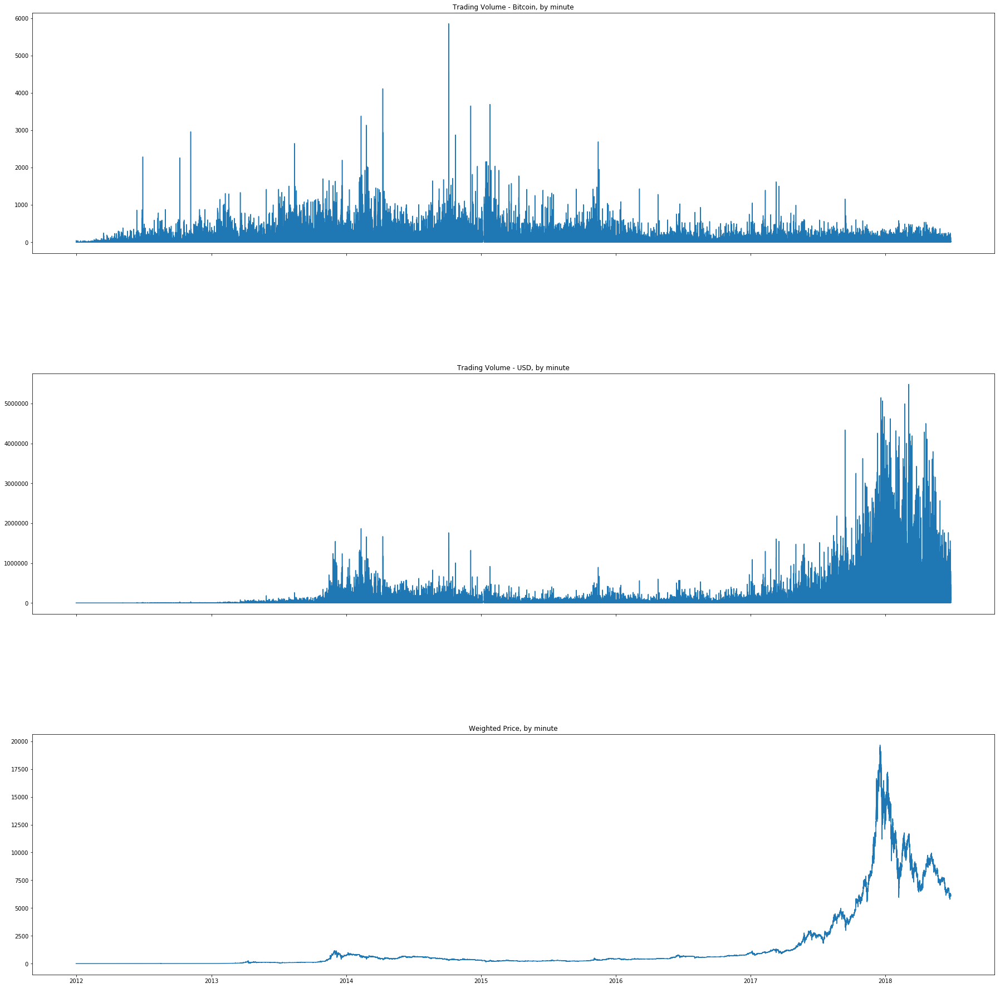

In [31]:
# Step 1.3b: Show some charts
# plot the minute-by-minute data
years = mdates.YearLocator()   # every year
months = mdates.MonthLocator()  # every month
yearsFmt = mdates.DateFormatter('%Y')

fig, axarr = plt.subplots(nrows = 3, ncols = 1, num = 3, sharex=True, figsize=(6,6))
axarr[0].plot(df['Time'], df['Volume_(BTC)'])
axarr[0].set_title('Trading Volume - Bitcoin, by minute')
axarr[1].plot(df['Time'], df['Volume_(Currency)'])
axarr[1].set_title('Trading Volume - USD, by minute')
axarr[2].plot(df['Time'], df['Weighted_Price'])
axarr[2].set_title('Weighted Price, by minute')

fig.subplots_adjust(left=0, bottom=0, right=4, top=4, wspace=None, hspace=0.5)

fig.show()

### 1.3.1  Basic Aggregation and Feature Generation by Day

Here, we group the minute-level data by the day corresponding to each row and compute the following summary statistics:  Min, Max, Mean and Standard Deviation.

The plots below demonstrate trends similar to those observed above, but by reducing our observations from around 3.6 million minute-level records to about 2,400 daily values we can enhance the computational efficiency of the analysis without losing important trends.

In [33]:
##########################################################################################################
# Swapping out the un-normalized dataset for df_minmax_normalized for the df_daily analysis here.
##########################################################################################################

# Step 1.3.1: group minute-by-minute data points by day to view the standard deviation of the features in the array below
# df_transform = df.groupby(['Date'])['Open', 'High', 'Low', 'Close', 'Volume_(BTC)', 'Weighted_Price'].agg(['min', 'max', 'std','mean'])
df_daily = df_minmax_normalized.groupby(['Date'])['Open', 'High', 'Low', 'Close', 'Volume_(BTC)', 'Volume_(Currency)', 'Weighted_Price'].agg(['min', 'max', 'std','mean'])
# removing '2018-06-27' because I know these values contain NA values and can't be used for training data.
#df_daily = df_daily[df_daily.index != '2018-06-27']

# renaming columns
df_daily.columns = ['Open_min','Open_max','Open_std','Open_mean',\
                      'High_min','High_max','High_std','High_mean', \
                      'Low_min','Low_max','Low_std','Low_mean',\
                      'Close_min','Close_max','Close_std','Close_mean',\
                      'Vol_BTC_min','Vol_BTC_max','Vol_BTC_std','Vol_BTC_mean',\
                      'Vol_Currency_min','Vol_Currency_max','Vol_Currency_std','Vol_Currency_mean',\
                      'Wt_Price_min','Wt_Price_max','Wt_Price_std','Wt_Price_mean']
# only 2,368 data elements in this dataframe
df_daily['Time'] = pd.to_datetime(df_daily.index, unit = 's', infer_datetime_format = 'True')

print(df_daily.shape)
# df_daily.head()

(2368, 29)


In [34]:
df_daily = df_daily.dropna(how='any')
df_daily.head()

,Open_min,Open_max,Open_std,Open_mean,High_min,High_max,High_std,High_mean,Low_min,Low_max,...,Vol_BTC_mean,Vol_Currency_min,Vol_Currency_max,Vol_Currency_std,Vol_Currency_mean,Wt_Price_min,Wt_Price_max,Wt_Price_std,Wt_Price_mean,Time
Date,,,,,,,,,,,,,,,,,,,,,
2011-12-31,0.000030,0.000040,0.000005,0.000034,0.000030,0.000040,0.000005,0.000034,0.000147,0.000157,...,0.001297,3.647458e-07,0.000038,0.000010,0.000006,0.000030,0.000040,0.000005,0.000034,2011-12-31
2012-01-01,0.000040,0.000061,0.000007,0.000045,0.000040,0.000061,0.000007,0.000045,0.000157,0.000178,...,0.001001,1.254572e-06,0.000009,0.000004,0.000005,0.000040,0.000061,0.000007,0.000045,2012-01-01
2012-01-02,0.000061,0.000061,0.000000,0.000061,0.000061,0.000061,0.000000,0.000061,0.000178,0.000178,...,0.001976,9.209831e-06,0.000017,0.000003,0.000011,0.000061,0.000061,0.000000,0.000061,2012-01-02
2012-01-03,0.000061,0.000077,0.000007,0.000068,0.000061,0.000077,0.000007,0.000068,0.000178,0.000194,...,0.002307,1.874793e-08,0.000028,0.000008,0.000013,0.000061,0.000077,0.000007,0.000068,2012-01-03
2012-01-04,0.000057,0.000080,0.000010,0.000070,0.000057,0.000090,0.000013,0.000073,0.000175,0.000197,...,0.002942,1.805492e-07,0.000043,0.000016,0.000017,0.000057,0.000084,0.000011,0.000071,2012-01-04


/home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages/matplotlib/figure.py:459: UserWarning: matplotlib is currently using a non-GUI backend, so cannot show the figure
  "matplotlib is currently using a non-GUI backend, "


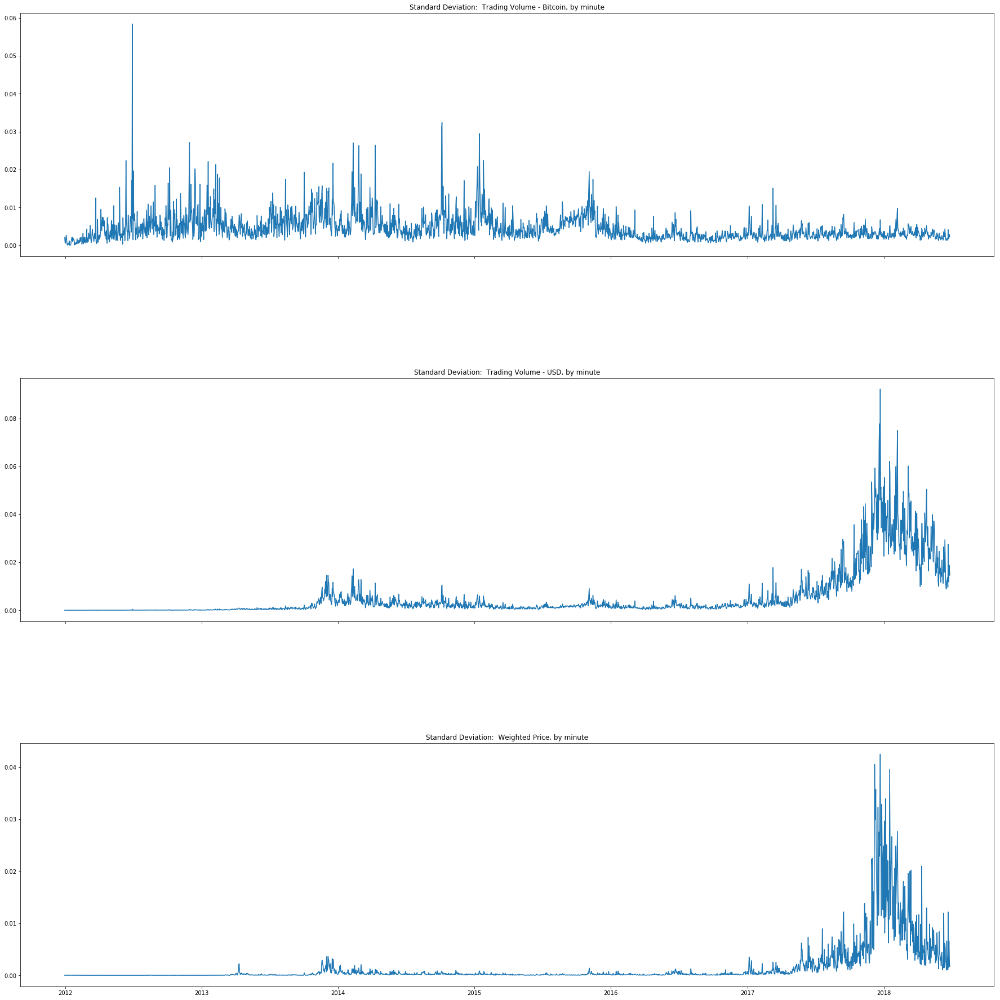

In [35]:
# Step 1.3.1: same charts using the standard deviation data when minute-level daata is grouped by day
# plotting the daily volatility measures

fig, axarr = plt.subplots(nrows = 3, ncols = 1, num = 3, sharex=True, figsize=(6,6))
axarr[0].plot(df_daily['Time'], df_daily['Vol_BTC_std'])
axarr[0].set_title('Standard Deviation:  Trading Volume - Bitcoin, by minute')
axarr[1].plot(df_daily['Time'], df_daily['Vol_Currency_std'])
axarr[1].set_title('Standard Deviation:  Trading Volume - USD, by minute')
axarr[2].plot(df_daily['Time'], df_daily['Wt_Price_std'])
axarr[2].set_title('Standard Deviation:  Weighted Price, by minute')

fig.subplots_adjust(left=0, bottom=0, right=4, top=4, wspace=None, hspace=0.5)

fig.show()


### 1.3.2  Percentage Changes, Aggregated by Day

This module creates a new set of features calculated as the percentage difference between the current set of features and their corresponding values preceding by 1 minute, 30 minutes and 60 minutes.

By looking at percentage changes over relatively small windows of time, we are attempting to account for the tremendous change the cryptocurrency market has experienced in the last 2 years in particular, which has greatly impacted the levels of price and trading volume.  Because those changes might overwhelm earlier trading activity, a set of features based in percentage change can mitigate that effect.  We can see in the graphs below that the activity trends are smoother compared to the plots above.

In [42]:
# 1.3.2

##########################################################################################################
# Swapping out the un-normalized dataset for df_minmax_normalized for the df_deltas analysis here.
##########################################################################################################

#create features based on the percentage difference between minute-level values and the corresponding values in the precending minute,
#30 minutes prior and 60 minutes prior.
df_deltas = df_minmax_normalized.copy()
# filter Volume values. There are some values in this data set that are very close to zero.
# when we perform percent change calculations on those values, we calculate extremely large values that overwhelm the anomaly scores.
#df_deltas = df_deltas[df_deltas['Volume_(BTC)'] > 1] 
df_deltas[['Open_delta_1', 'High_delta_1', 'Low_delta_1', 'Close_delta_1', 'Volume_(BTC)_delta_1', 'Volume_(Currency)_delta_1', 'Weighted_Price_delta_1']] = df_deltas[['Open', 'High', 'Low', 'Close', 'Volume_(BTC)', 'Volume_(Currency)', 'Weighted_Price']].pct_change(periods = 1)
df_deltas[['Open_delta_30', 'High_delta_30', 'Low_delta_30', 'Close_delta_30', 'Volume_(BTC)_delta_30', 'Volume_(Currency)_delta_30', 'Weighted_Price_delta_30']] = df_deltas[['Open', 'High', 'Low', 'Close', 'Volume_(BTC)', 'Volume_(Currency)', 'Weighted_Price']].pct_change(periods = 30)
df_deltas[['Open_delta_60', 'High_delta_60', 'Low_delta_60', 'Close_delta_60', 'Volume_(BTC)_delta_60', 'Volume_(Currency)_delta_60', 'Weighted_Price_delta_60']] = df_deltas[['Open', 'High', 'Low', 'Close', 'Volume_(BTC)', 'Volume_(Currency)', 'Weighted_Price']].pct_change(periods = 60)

#removes the columns that were used to form the percentage delta features from  df_deltas
#this data will be used again beginning with step 16
df_deltas = df_deltas[df_deltas.columns.difference(["Open", "High", "Low", "Close", "Volume_(BTC)", "Volume_(Currency)", "Weighted_Price"])]
df_deltas = df_deltas.dropna(how='any')
df_deltas.head()

,Close_delta_1,Close_delta_30,Close_delta_60,Date,High_delta_1,High_delta_30,High_delta_60,Hour,Low_delta_1,Low_delta_30,...,Time,Volume_(BTC)_delta_1,Volume_(BTC)_delta_30,Volume_(BTC)_delta_60,Volume_(Currency)_delta_1,Volume_(Currency)_delta_30,Volume_(Currency)_delta_60,Weighted_Price_delta_1,Weighted_Price_delta_30,Weighted_Price_delta_60
60,0.0,0.0,0.0,2011-12-31,0.0,0.0,0.0,2011-12-31 08:00:00,0.0,0.0,...,2011-12-31 08:52:00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
61,0.0,0.0,0.0,2011-12-31,0.0,0.0,0.0,2011-12-31 08:00:00,0.0,0.0,...,2011-12-31 08:53:00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
62,0.0,0.0,0.0,2011-12-31,0.0,0.0,0.0,2011-12-31 08:00:00,0.0,0.0,...,2011-12-31 08:54:00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
63,0.0,0.0,0.0,2011-12-31,0.0,0.0,0.0,2011-12-31 08:00:00,0.0,0.0,...,2011-12-31 08:55:00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
64,0.0,0.0,0.0,2011-12-31,0.0,0.0,0.0,2011-12-31 08:00:00,0.0,0.0,...,2011-12-31 08:56:00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [43]:
df_deltas.describe()

,Close_delta_1,Close_delta_30,Close_delta_60,High_delta_1,High_delta_30,High_delta_60,Low_delta_1,Low_delta_30,Low_delta_60,Open_delta_1,...,Open_delta_60,Volume_(BTC)_delta_1,Volume_(BTC)_delta_30,Volume_(BTC)_delta_60,Volume_(Currency)_delta_1,Volume_(Currency)_delta_30,Volume_(Currency)_delta_60,Weighted_Price_delta_1,Weighted_Price_delta_30,Weighted_Price_delta_60
count,3.405765e+06,3.405765e+06,3.405765e+06,3.405765e+06,3.405765e+06,3.405765e+06,3.405765e+06,3.405765e+06,3.405765e+06,3.405765e+06,...,3.405765e+06,3.405765e+06,3.405765e+06,3.405765e+06,3.405765e+06,3.405765e+06,3.405765e+06,3.405765e+06,3.405765e+06,3.405765e+06
mean,inf,inf,inf,inf,inf,inf,inf,inf,inf,inf,...,inf,inf,inf,inf,inf,inf,inf,inf,inf,inf
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
min,-1.000000e+00,-1.000000e+00,-1.000000e+00,-1.000000e+00,-1.000000e+00,-1.000000e+00,-1.000000e+00,-1.000000e+00,-1.000000e+00,-1.000000e+00,...,-1.000000e+00,-1.000000e+00,-1.000000e+00,-1.000000e+00,-1.000000e+00,-1.000000e+00,-1.000000e+00,-1.000000e+00,-1.000000e+00,-1.000000e+00
25%,-2.185936e-05,-1.919764e-03,-2.698130e-03,-1.617730e-05,-1.876602e-03,-2.721400e-03,-1.224213e-06,-1.899251e-03,-2.668342e-03,-2.243863e-05,...,-2.700659e-03,-4.184462e-01,-7.760245e-01,-7.927711e-01,-4.184143e-01,-7.759068e-01,-7.925736e-01,-7.530461e-05,-1.908055e-03,-2.730359e-03
50%,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
75%,2.642078e-05,2.229505e-03,3.187968e-03,0.000000e+00,2.132196e-03,3.171806e-03,4.075810e-05,2.279666e-03,3.238908e-03,2.873811e-05,...,3.233740e-03,6.915423e-01,3.428900e+00,3.799486e+00,6.914301e-01,3.427844e+00,3.794482e+00,1.086275e-04,2.236898e-03,3.272519e-03
max,inf,inf,inf,inf,inf,inf,inf,inf,inf,inf,...,inf,inf,inf,inf,inf,inf,inf,inf,inf,inf


/home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages/matplotlib/figure.py:459: UserWarning: matplotlib is currently using a non-GUI backend, so cannot show the figure
  "matplotlib is currently using a non-GUI backend, "


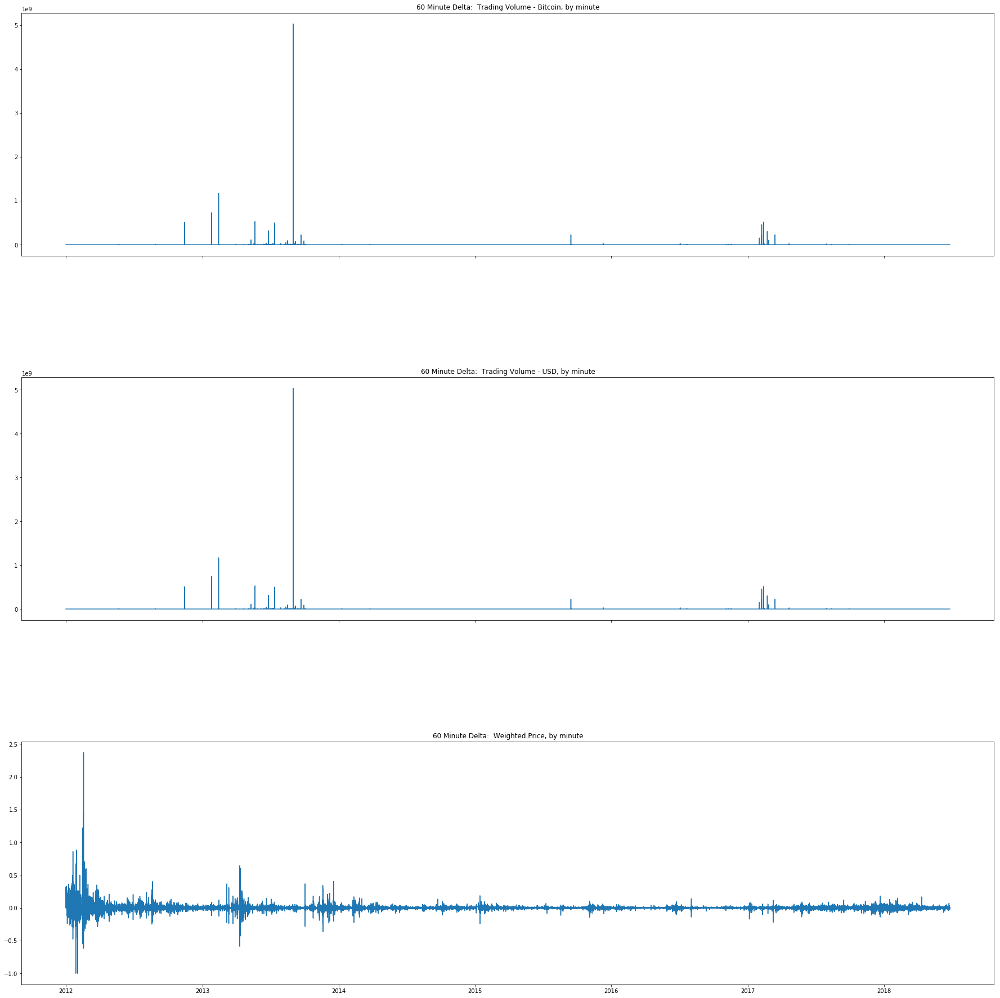

In [45]:
# Step 1.3.3: same charts using the 60-minute delta data when minute-level daata is grouped by day
# plotting the daily volatility measures

fig, axarr = plt.subplots(nrows = 3, ncols = 1, num = 3, sharex=True, figsize=(6,6))
axarr[0].plot(df_deltas['Time'], df_deltas['Volume_(BTC)_delta_60'])
axarr[0].set_title('60 Minute Delta:  Trading Volume - Bitcoin, by minute')
axarr[1].plot(df_deltas['Time'], df_deltas['Volume_(Currency)_delta_60'])
axarr[1].set_title('60 Minute Delta:  Trading Volume - USD, by minute')
axarr[2].plot(df_deltas['Time'], df_deltas['Weighted_Price_delta_60'])
axarr[2].set_title('60 Minute Delta:  Weighted Price, by minute')

fig.subplots_adjust(left=0, bottom=0, right=4, top=4, wspace=None, hspace=0.5)

fig.show()


### 1.3.3 30-Day Rolling Averages and Rolling Standard Deviations

In this module we create a set of features around differentiating single row observations from the preceding rolling averages to account for magnitude of change over a fairly stable baseline rather than focusing on the raw levels of the underlying values.



In [46]:
# 1.3.3

##########################################################################################################
# Swapping out the un-normalized dataset for df_minmax_normalized for the df_deltas analysis here.
##########################################################################################################

df_rolling = df_minmax_normalized.copy()
df_rolling = df_rolling.groupby(by=['Date'], as_index=True).agg({'Open':'first',
                                                                 'Low': 'min', 
                                                                 'Weighted_Price':'mean', 
                                                                 'High': 'max', 
                                                                 'Close':'last',
                                                                 'Volume_(BTC)' : 'sum', 
                                                                 'Volume_(Currency)' : 'sum'})

df_rolling['Price30DayRollMean'] = df_rolling['Weighted_Price'].rolling(30).mean()
df_rolling['PriceMinus30DayRollMean'] = df_rolling['Weighted_Price']-df_rolling['Weighted_Price'].rolling(30).mean()
df_rolling['PriceIntraDayDelta'] =  df_rolling['High'] - df_rolling['Low']

df_rolling['Volume30DayRollMean'] = df_rolling['Volume_(BTC)'].rolling(30).mean()
df_rolling['VolumeMinus30DayRollMean'] = df_rolling['Volume_(BTC)']-df_rolling['Volume_(BTC)'].rolling(30).mean()

df_rolling['Price30DayRollStDev'] = df_rolling['Weighted_Price'].rolling(30).std()
df_rolling['Volume30DayRollStDev'] = df_rolling['Volume_(BTC)'].rolling(30).std()

df_rolling = df_rolling.drop(columns=['Open','Close','High','Low'], axis=1)

#drop the first 30 records because they won't have data to calculate the largest-window moving average & standard deviation
df_rolling.drop(df_rolling.index[:30], inplace=True)

# reality check - make sure the dataframe looks right so far.
df_rolling = df_rolling.dropna(how='any')
df_rolling.head()

,Weighted_Price,Volume_(BTC),Volume_(Currency),Price30DayRollMean,PriceMinus30DayRollMean,PriceIntraDayDelta,Volume30DayRollMean,VolumeMinus30DayRollMean,Price30DayRollStDev,Volume30DayRollStDev
Date,,,,,,,,,,
2012-01-30,0.000087,0.895920,0.005261,0.000125,-0.000038,-0.000103,1.235937,-0.340017,0.000034,1.105759
2012-01-31,0.000092,0.713636,0.004402,0.000126,-0.000035,0.000006,1.211661,-0.498025,0.000032,1.109071
2012-02-01,0.000090,0.584212,0.003626,0.000127,-0.000038,-0.000082,1.136293,-0.552081,0.000030,1.070381
2012-02-02,0.000117,1.331048,0.008576,0.000129,-0.000012,-0.000097,1.069914,0.261133,0.000028,0.988772
2012-02-03,0.000122,1.068358,0.006989,0.000131,-0.000009,-0.000096,0.964318,0.104040,0.000026,0.787671


<Figure size 720x432 with 0 Axes>

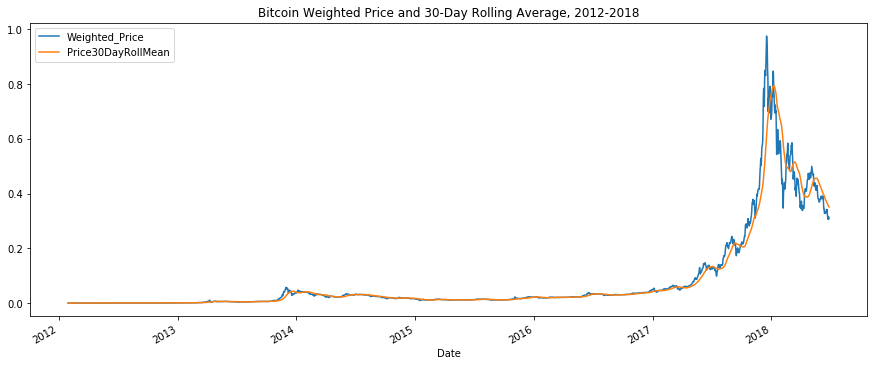

In [49]:
# Step 1.3.3b: df_rolling summaary charts

# Plotting price vs 30-day rolling average of price

plt.figure(figsize=(10,6), facecolor='white')
fig, axis = plt.subplots(nrows=1, ncols=1, sharex=False, sharey=False, figsize=(15,6))

df_rolling['Weighted_Price'].plot(legend=True)
df_rolling['Price30DayRollMean'].plot(legend=True)
axis.set_title("Bitcoin Weighted Price and 30-Day Rolling Average, 2012-2018")

plt.savefig('price_and_rolling_average.png', bbox_inches='tight')

<Figure size 720x2880 with 0 Axes>

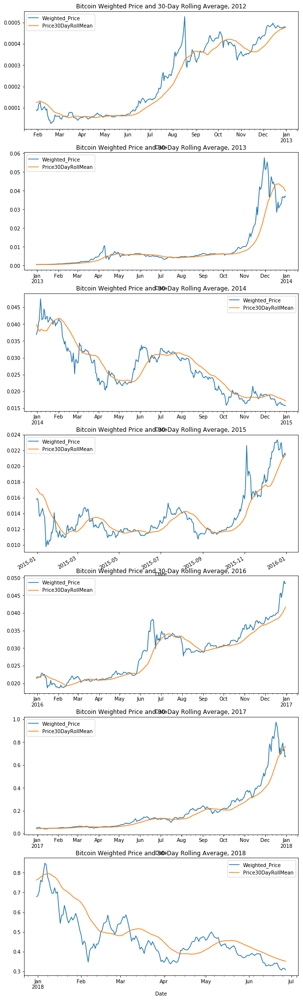

In [50]:
# Step 1.3.3c
# Plotting price vs 30-Day rolling average of price, zooming in on individual years

# http://jonathansoma.com/lede/data-studio/classes/small-multiples/long-explanation-of-using-plt-subplots-to-create-small-multiples/
plt.figure(figsize=(10,40), facecolor='white')

sz = 7
plot_number = 0
fig, axes = plt.subplots(nrows=sz, ncols=1, sharex=False, sharey=False, figsize=(10,40))

years = pd.date_range(start='2011-01-02', periods=8, freq='1Y')

for year in range(7):
    #print( str(years[year]) + " to " + str(years[year+1]) )
    df_rolling_yr = df_rolling.loc[years[year]:years[year+1]]
    ax = axes[plot_number]
    df_rolling_yr['Weighted_Price'].plot(ax = ax, legend=True)
    df_rolling_yr['Price30DayRollMean'].plot(ax = ax, legend=True)
    ax.set_title("Bitcoin Weighted Price and 30-Day Rolling Average, " + years[year+1].strftime("%Y"))
    plot_number = plot_number + 1

plt.savefig('price_and_rolling_average.png', bbox_inches='tight')

<Figure size 1152x432 with 0 Axes>

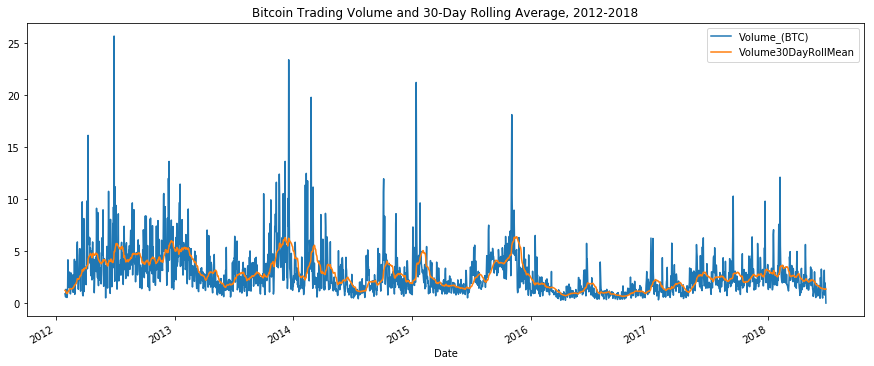

In [51]:
# Step 1.3.3d
# Plotting volume vs 30-day rolling average of volume

plt.figure(figsize=(16,6), facecolor='white')
fig, axis = plt.subplots(nrows=1, ncols=1, sharex=False, sharey=False, figsize=(15,6))

df_rolling['Volume_(BTC)'].plot(legend=True)
df_rolling['Volume30DayRollMean'].plot(legend=True)
axis.set_title("Bitcoin Trading Volume and 30-Day Rolling Average, 2012-2018")

plt.savefig('volume_and_rolling_average.png', bbox_inches='tight')
    

<Figure size 720x2880 with 0 Axes>

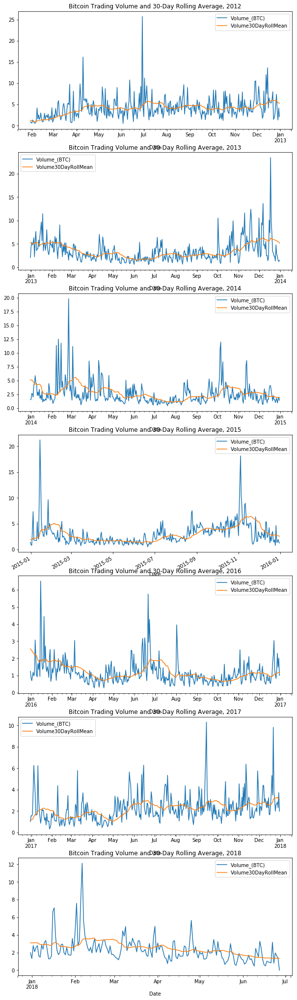

In [52]:
# Step 1.3.3e
# Plotting volume vs 30-Day rolling average of volume, zooming in on individual years

# http://jonathansoma.com/lede/data-studio/classes/small-multiples/long-explanation-of-using-plt-subplots-to-create-small-multiples/
plt.figure(figsize=(10,40), facecolor='white')

plot_number = 0
fig, axes = plt.subplots(nrows=sz, ncols=1, sharex=False, sharey=False, figsize=(10,40))

for year in range(7):
    #print( str(years[year]) + " to " + str(years[year+1]) )
    df_rolling_yr = df_rolling.loc[years[year]:years[year+1]]
    ax = axes[plot_number]
    df_rolling_yr['Volume_(BTC)'].plot(ax = ax, legend=True)
    df_rolling_yr['Volume30DayRollMean'].plot(ax = ax, legend=True)
    ax.set_title("Bitcoin Trading Volume and 30-Day Rolling Average, " + years[year+1].strftime("%Y"))
    plot_number = plot_number + 1

plt.savefig('price_and_rolling_average.png', bbox_inches='tight')

<Figure size 1152x432 with 0 Axes>

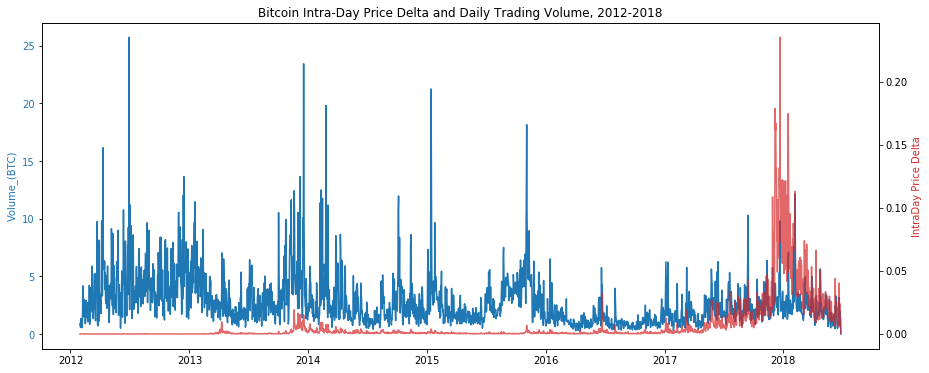

In [53]:
# Step 1.3.3f
# Plotting price intra-day deltas (high price minus low price for each day)

plt.figure(figsize=(16,6), facecolor='white')
fig, axis = plt.subplots(nrows=1, ncols=1, sharex=False, sharey=False, figsize=(15,6))

color = 'tab:blue'
axis.set_ylabel('Volume_(BTC)', color=color) 
axis.plot(df_rolling['Volume_(BTC)'], color=color)
axis.tick_params(axis='y', labelcolor=color)

ax2 = axis.twinx()
color = 'tab:red'
ax2.set_ylabel('IntraDay Price Delta', color=color) 
ax2.plot(df_rolling['PriceIntraDayDelta'], color=color, alpha=0.7)
ax2.set_title("Bitcoin Intra-Day Price Delta and Daily Trading Volume, 2012-2018")



plt.savefig('volume_and_rolling_average.png', bbox_inches='tight')

<Figure size 720x2880 with 0 Axes>

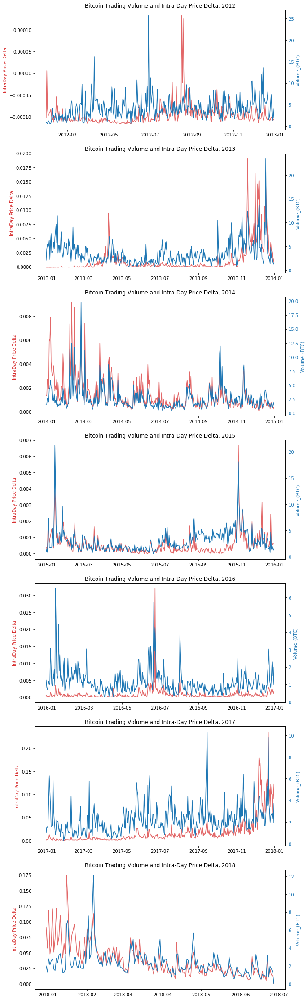

In [54]:
# Step 1.3.3g

plt.figure(figsize=(10,40), facecolor='white')

plot_number = 0
fig, axes = plt.subplots(nrows=sz, ncols=1, sharex=False, sharey=False, figsize=(10,40))

for year in range(7):
    #print( str(years[year]) + " to " + str(years[year+1]) )
    df_rolling_yr = df_rolling.loc[years[year]:years[year+1]]
    ax = axes[plot_number]
    ax2 = ax.twinx()
    
    ax.set_title("Bitcoin Trading Volume and Intra-Day Price Delta, " + years[year+1].strftime("%Y"))
    
    color = 'tab:red'
    ax.set_ylabel('IntraDay Price Delta', color=color) 
    ax.plot(df_rolling_yr['PriceIntraDayDelta'], color=color, alpha=0.7)
    
    color = 'tab:blue'
    ax2.set_ylabel('Volume_(BTC)', color=color) 
    ax2.plot(df_rolling_yr['Volume_(BTC)'], color=color)
    ax2.tick_params(axis='y', labelcolor=color)
    
    plot_number = plot_number + 1

plt.savefig('daily_intraday_price_delta_by_year.png', bbox_inches='tight')

#### Rolling standard deviations of price and volume

<Figure size 1152x432 with 0 Axes>

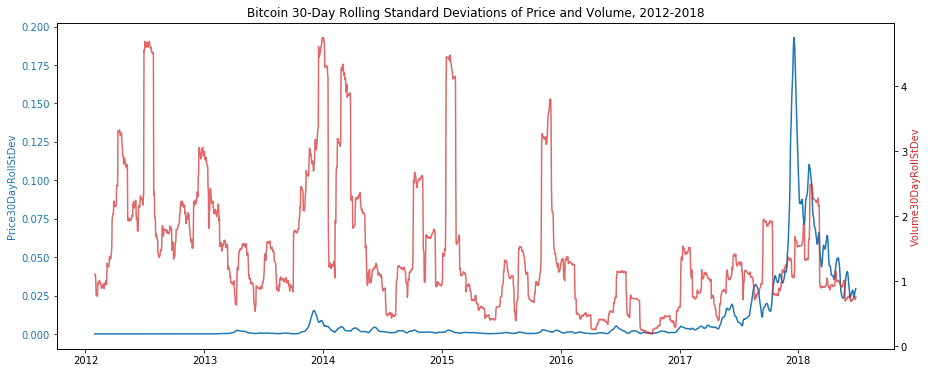

In [55]:
# Step 1.3.3h
#Price30DayRollStDev
#Volume30DayRollStDev
# Plotting rolling standard deviations of price and volume

plt.figure(figsize=(16,6), facecolor='white')
fig, axis = plt.subplots(nrows=1, ncols=1, sharex=False, sharey=False, figsize=(15,6))

color = 'tab:blue'
axis.set_ylabel('Price30DayRollStDev', color=color) 
axis.plot(df_rolling['Price30DayRollStDev'], color=color)
axis.tick_params(axis='y', labelcolor=color)

ax2 = axis.twinx()
color = 'tab:red'
ax2.set_ylabel('Volume30DayRollStDev', color=color) 
ax2.plot(df_rolling['Volume30DayRollStDev'], color=color, alpha=0.7)
ax2.set_title("Bitcoin 30-Day Rolling Standard Deviations of Price and Volume, 2012-2018")



plt.savefig('price_and_volume_rolling_stdev.png', bbox_inches='tight')


<Figure size 720x2880 with 0 Axes>

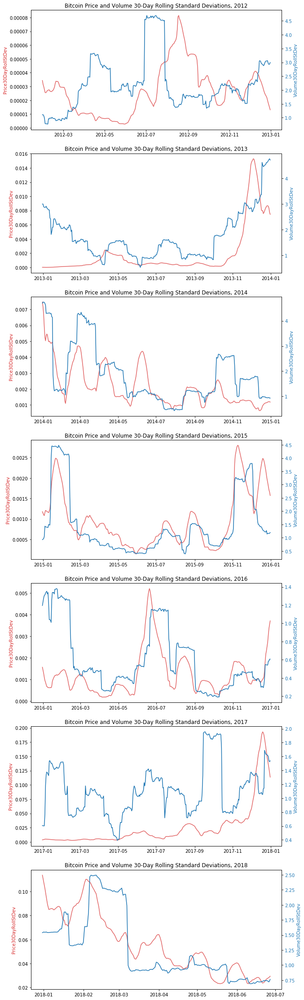

In [58]:
# Step 1.3.3i
#Price30DayRollStDev
#Volume30DayRollStDev
# Plotting rolling standard deviations of price and volume, zooming in on single years

plt.figure(figsize=(10,40), facecolor='white')

plot_number = 0
fig, axes = plt.subplots(nrows=sz, ncols=1, sharex=False, sharey=False, figsize=(10,40))

for year in range(7):
    #print( str(years[year]) + " to " + str(years[year+1]) )
    df_rolling_yr = df_rolling.loc[years[year]:years[year+1]]
    ax = axes[plot_number]
    ax2 = ax.twinx()
    
    ax.set_title("Bitcoin Price and Volume 30-Day Rolling Standard Deviations, " + years[year+1].strftime("%Y"))
    
    color = 'tab:red'
    ax.set_ylabel('Price30DayRollStDev', color=color) 
    ax.plot(df_rolling_yr['Price30DayRollStDev'], color=color, alpha=0.7)
    
    color = 'tab:blue'
    ax2.set_ylabel('Volume30DayRollStDev', color=color) 
    ax2.plot(df_rolling_yr['Volume30DayRollStDev'], color=color)
    ax2.tick_params(axis='y', labelcolor=color)
    
    plot_number = plot_number + 1

plt.savefig('rolling_stdev_price_and_volume_by_year.png', bbox_inches='tight')

# 2. Training
Place holder for description

## 2.1  RCF model with df_daily dataframe

In [60]:
# Step 2.1: create the random cut forest object, defining two parameters: num_samples_per_tree and num_trees.
# This will generate a model using the daily standard deviation dataframe

# I don't have the ability to write to Scott's S3 bucket, so I am writing to my own for now.

session = sagemaker.Session()
#bucket = 'ads-bucket-senichol'
#prefix = 'kaggle-crypto-data'

bucket = 'sagemaker-davidrob'
prefix = 'group-project/bitcoin'

# specify general training job information
rcf = RandomCutForest(role=execution_role,
                      train_instance_count=1,
                      train_instance_type='ml.c5.xlarge',
                      data_location='s3://{}/{}/'.format(bucket, prefix),
                      output_path='s3://{}/{}/output'.format(bucket, prefix),
                      num_samples_per_tree=200,
                      num_trees=200)
# automatically upload the training data to S3 and run the training job

rcf.fit(rcf.record_set(df_daily.values))

ValueError: Unsupported dtype object on array

It takes a few minutes for the training instance to become available.

Don't worry about the output text above turning red. That's not an indication of an error.

You can view the status of a training job using the AWS SageMaker console. Just click on the "Jobs" tab and select training job matching the training job name, below.
https://console.aws.amazon.com/sagemaker/home?region=us-east-1#/jobs

If you see the message 

> `Billable seconds: nn`

at the end of the output in the box above, that means training successfully completed and the output RCF model was stored in the specified output path.

Building the model with the daily standard deviation data took about 5 minutes and 60 billable seconds.

In [118]:
# Step 2.1b: another reality check, confirming the name of the new training job. Not very helpful, atcually.
print('Training job name: {}'.format(rcf.latest_training_job.job_name))

Training job name: randomcutforest-2018-10-13-04-22-08-430


In [19]:
# Step 2.1c:  spin up endpoint instances for generating anamaly scores. 
# At this point, we're just starting the endpoint machines, which takes some time.

rcf_inference = rcf.deploy(
    initial_instance_count=1,
    instance_type='ml.c5.xlarge',
)

INFO:sagemaker:Creating model with name: randomcutforest-2018-10-13-18-58-03-590
INFO:sagemaker:Creating endpoint with name randomcutforest-2018-10-13-18-53-13-500


-------------------------------------------------------------!

Building the endpoint also takes some time. 5 or 10 minutes.

You can confirm the endpoint configuration and status by navigating to the "Endpoints" tab in the AWS SageMaker console and selecting the endpoint matching the endpoint name, below.  (https://console.aws.amazon.com/sagemaker/home?region=us-east-1#/endpoints)

In [20]:
# Step 2.1c: getting ready to send data to the endpoint so that it will spit out anomaly scores

rcf_inference.content_type = 'text/csv'
rcf_inference.serializer = csv_serializer
rcf_inference.accept = 'application/json'
rcf_inference.deserializer = json_deserializer

In [21]:
# Step 2.1d: Here we take the original data and reformat it according to the format we just specified in step 10.
df_daily_numpy = df_daily.as_matrix()

In [22]:
# Step 2.1e: We generated anomaly scores for the daily std_dev records. let's look at them.

results = rcf_inference.predict(df_daily_numpy)
scores = [datum['score'] for datum in results['scores']]

# add scores to daily std_dev dataframe and print first few values
df_daily['score'] = pd.Series(scores, index=df_daily.index)
df_daily['date'] = df_daily.index
df_daily.head()

,Open_min,Open_max,Open_std,Open_mean,High_min,High_max,High_std,High_mean,Low_min,Low_max,...,Vol_Currency_min,Vol_Currency_max,Vol_Currency_std,Vol_Currency_mean,Wt_Price_min,Wt_Price_max,Wt_Price_std,Wt_Price_mean,score,date
Date,,,,,,,,,,,,,,,,,,,,,
2011-12-31,4.39,4.58,0.094181,4.472552,4.39,4.58,0.094229,4.472624,4.39,4.58,...,2.00000,210.720000,52.694724,34.069690,4.39,4.580000,0.094193,4.472579,1.713186,2011-12-31
2012-01-01,4.58,5.00,0.139856,4.680778,4.58,5.00,0.139856,4.680778,4.58,5.00,...,6.87916,50.500000,19.802958,27.856539,4.58,5.000000,0.139856,4.680778,1.740506,2012-01-01
2012-01-02,5.00,5.00,0.000000,5.000000,5.00,5.00,0.000000,5.000000,5.00,5.00,...,50.50000,95.240000,16.567370,57.832389,5.00,5.000000,0.000000,5.000000,1.742434,2012-01-02
2012-01-03,5.00,5.32,0.145733,5.145917,5.00,5.32,0.145733,5.145917,5.00,5.32,...,0.10280,155.010000,46.211054,68.725391,5.00,5.320000,0.145733,5.145917,1.711285,2012-01-03
2012-01-04,4.93,5.37,0.189487,5.176708,4.93,5.57,0.252133,5.228729,4.93,5.37,...,0.99000,235.747069,85.932931,91.624089,4.93,5.442972,0.210158,5.195443,1.715284,2012-01-04


In [23]:
df_daily.columns

Index(['Open_min', 'Open_max', 'Open_std', 'Open_mean', 'High_min', 'High_max',
       'High_std', 'High_mean', 'Low_min', 'Low_max', 'Low_std', 'Low_mean',
       'Close_min', 'Close_max', 'Close_std', 'Close_mean', 'Vol_BTC_min',
       'Vol_BTC_max', 'Vol_BTC_std', 'Vol_BTC_mean', 'Vol_Currency_min',
       'Vol_Currency_max', 'Vol_Currency_std', 'Vol_Currency_mean',
       'Wt_Price_min', 'Wt_Price_max', 'Wt_Price_std', 'Wt_Price_mean',
       'score', 'date'],
      dtype='object')

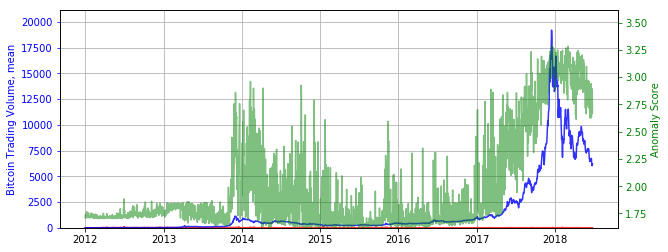

In [24]:
# Step 2.1f: Plot the anomaly scores along with some features from the daily std_dev data

fig, ax1 = plt.subplots()
ax2 = ax1.twinx()

#https://matplotlib.org/2.0.2/api/colors_api.html

ax1.plot(df_daily['Vol_BTC_mean'], color='r', alpha=0.8)
ax1.plot(df_daily['High_mean'], color='b', alpha=0.8)
ax2.plot(df_daily['score'], color='g', alpha=0.5)

ax1.grid(which='major', axis='both')

ax1.set_ylabel('Bitcoin Trading Volume, mean', color='b')
ax2.set_ylabel('Anomaly Score', color='g')

ax1.tick_params('y', colors='b')
ax2.tick_params('y', colors='g')

ax1.set_ylim(0, 1.1*df_daily['High_mean'].max())
ax2.set_ylim(df_daily['score'].min(), 1.1*df_daily['score'].max())
fig.set_figwidth(10)


In [25]:
# Step 2.1g: Anomalies are defined as scores greater than 3 standard deviations fronm the mean of score.

score_mean = df_daily['score'].mean()
score_std = df_daily['score'].std()
score_cutoff = score_mean + 2*score_std
print("Score mean:" + str(score_mean) + ", Score std: " + str(score_std) + "Score cutoff:" + str(score_cutoff))
anomalies = df_daily[df_daily['score'] > score_cutoff]
print("At a 2 sd threshhold, there are " + str(len(anomalies.score)) + " anomalies.")
anomalies.head()

Score mean:1.9855694679231095, Score std: 0.4504946288398535Score cutoff:2.8865587256028165
At a 3 sd threshhold, there are 203 anomalies.


,Open_min,Open_max,Open_std,Open_mean,High_min,High_max,High_std,High_mean,Low_min,Low_max,...,Vol_Currency_min,Vol_Currency_max,Vol_Currency_std,Vol_Currency_mean,Wt_Price_min,Wt_Price_max,Wt_Price_std,Wt_Price_mean,score,date
Date,,,,,,,,,,,,,,,,,,,,,
2014-02-10,535.30,709.90,24.851997,673.042396,535.31,713.00,24.078926,674.580819,530.00,703.47,...,5.250774,1.865889e+06,94768.151304,32476.952005,533.932106,708.953440,24.802235,673.132713,2.960943,2014-02-10
2014-02-24,520.00,614.84,17.260934,568.126479,534.00,629.00,17.147607,568.881576,514.02,611.52,...,2.764945,1.659301e+06,69139.908124,20481.230439,522.883099,618.654581,17.318245,567.900690,2.897734,2014-02-24
2014-04-10,357.57,442.46,17.718233,408.493917,360.00,442.46,17.407173,409.333083,357.57,442.46,...,0.999998,1.666193e+06,62229.951461,14026.139859,358.124877,442.460000,17.695231,408.518630,2.899384,2014-04-10
2014-10-05,277.97,338.90,14.449493,315.704250,278.17,339.43,14.304777,316.283924,275.00,338.70,...,5.492846,1.761476e+06,54618.684666,13290.427019,276.258759,339.005264,14.555745,315.678048,2.926526,2014-10-05
2017-03-10,983.00,1329.66,49.346348,1202.469681,1009.92,1350.00,48.877499,1203.985424,975.00,1312.03,...,4.186206,1.605414e+06,97519.963849,27271.946827,993.412590,1338.026120,49.640416,1202.407481,2.888060,2017-03-10


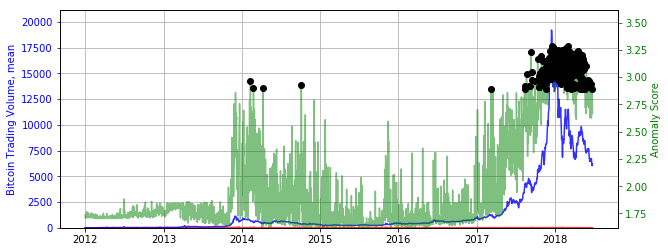

In [26]:
# Step 2.1h: Add the anomalies to the plot.

ax2.plot(anomalies.index, anomalies.score, 'ko')
fig
# high anomaly scores are highly concentrated around the end of 2017/beginning of 2018.

In [27]:
df_daily['Date'] = df_daily.index

In [29]:
# step 2.1j: Save anomaly result to S3
prefix_result_folder = 'scores'
result_filename = 'df_daily_anomaly_scores_with_dates.csv'

df_daily.to_csv(result_filename, index=True, header=True)

#s3 = boto3.client(
#    's3'
 #   aws_access_key_id = access_key_id,
 #   aws_secret_access_key= secret_access_key,
#)

# Upload the file to S3
#with open(result_filename, 'rb') as data:
#    s3.upload_fileobj(data, bucket, Key=f'{prefix_result_folder}/{result_filename}')

In [81]:
# step 2.1k
#sagemaker.Session().delete_endpoint(rcf_inference.endpoint)
df_daily_scores.columns

Index(['Date', 'Open_min', 'Open_max', 'Open_std', 'Open_mean', 'High_min',
       'High_max', 'High_std', 'High_mean', 'Low_min', 'Low_max', 'Low_std',
       'Low_mean', 'Close_min', 'Close_max', 'Close_std', 'Close_mean',
       'Vol_BTC_min', 'Vol_BTC_max', 'Vol_BTC_std', 'Vol_BTC_mean',
       'Vol_Currency_min', 'Vol_Currency_max', 'Vol_Currency_std',
       'Vol_Currency_mean', 'Wt_Price_min', 'Wt_Price_max', 'Wt_Price_std',
       'Wt_Price_mean', 'score', 'anomalies'],
      dtype='object')

/home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages/statsmodels/nonparametric/kde.py:488: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
/home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2
/home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages/numpy/core/_methods.py:26: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims)


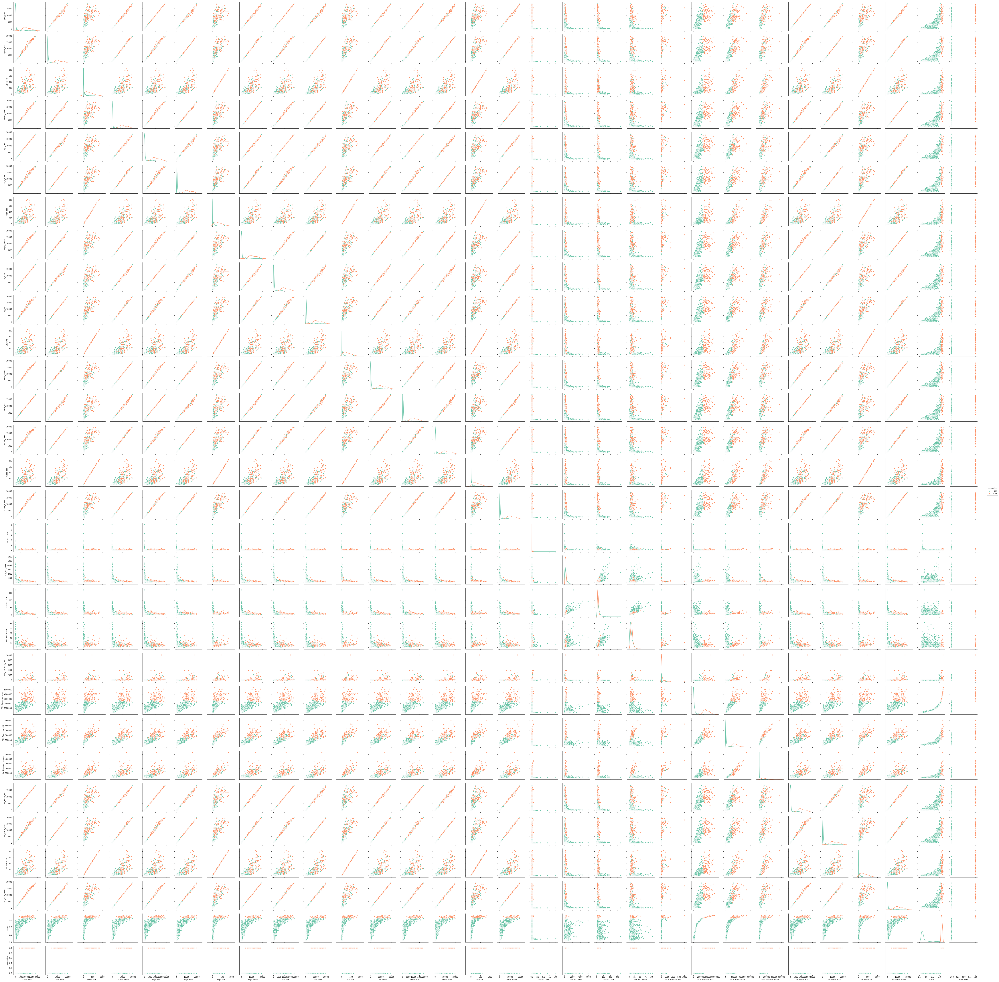

In [80]:
# step 2.1l
df_daily_scores = pd.read_csv('./scores/df_daily_anomaly_scores_with_dates.csv', encoding="ISO-8859-1", low_memory=False)

#minute_df = pd.read_csv('~/SageMaker/bitstampUSD_1-min_data_2012-01-01_to_2018-06-27.csv', encoding="ISO-8859-1", low_memory=False)
score_mean = df_daily_scores['score'].mean()
score_std = df_daily_scores['score'].std()
score_cutoff = score_mean + 2*score_std
df_daily_scores['anomalies'] = (df_daily_scores['score'] > score_cutoff)

df_daily_scores = df_daily_scores.drop(columns=['Date.1', 'date'])

g = sns.pairplot(df_daily_scores, hue="anomalies", palette="Set2", diag_kind="kde")
plt.show()

In [133]:
# step 2.1m
top_anomaly.to_csv('top_anomaly.csv', header=True)

## 2.2 RCF modelling with the df_deltas datraframe

In [61]:
#step 2.2a: data cleaning for percentage deltas model

# removing nas and inf values in the delta features. 
#df_deltas.loc[:,['Volume_(BTC)_delta_1', 'Volume_(BTC)_delta_30', 'Volume_(BTC)_delta_60']] = df_deltas.loc[:, ['Volume_(BTC)_delta_1', 'Volume_(BTC)_delta_30', 'Volume_(BTC)_delta_60']].replace(np.inf, np.nan)
#df_deltas = df_deltas.dropna(how="any")

# Remove unneeded time attributes
df_daily_deltas = df_deltas[df_deltas.columns.difference(["Minute", "Hour"])]
print(df_daily_deltas.columns)

# Group all emaining delta values by Date
df_daily_deltas = df_daily_deltas.groupby(['Date']).agg(['min', 'max', 'std','mean'])

# renaming columns
df_daily_deltas.columns = [ 'Close_delta_1_min', 'Close_delta_1_max', 'Close_delta_1_std', 'Close_delta_1_mean',
                            'Close_delta_30_min', 'Close_delta_30_max', 'Close_delta_30_std', 'Close_delta_30_mean',
                            'Close_delta_60_min', 'Close_delta_60_max', 'Close_delta_60_std', 'Close_delta_60_mean',
                            'High_delta_1_min', 'High_delta_1_max', 'High_delta_1_std', 'High_delta_1_mean',
                            'High_delta_30_min', 'High_delta_30_max', 'High_delta_30_std', 'High_delta_30_mean',
                            'High_delta_60_min', 'High_delta_60_max', 'High_delta_60_std', 'High_delta_60_mean',
                            'Low_delta_1_min', 'Low_delta_1_max', 'Low_delta_1_std', 'Low_delta_1_mean',
                            'Low_delta_30_min', 'Low_delta_30_max', 'Low_delta_30_std', 'Low_delta_30_mean',
                            'Low_delta_60_min', 'Low_delta_60_max', 'Low_delta_60_std', 'Low_delta_60_mean',
                            'Open_delta_1_min', 'Open_delta_1_max', 'Open_delta_1_std', 'Open_delta_1_mean',
                            'Open_delta_30_min', 'Open_delta_30_max', 'Open_delta_30_std', 'Open_delta_30_mean',
                            'Open_delta_60_min', 'Open_delta_60_max', 'Open_delta_60_std', 'Open_delta_60_mean',
                            'Volume_(BTC)_delta_1_min', 'Volume_(BTC)_delta_1_max', 'Volume_(BTC)_delta_1_std', 'Volume_(BTC)_delta_1_mean',
                            'Volume_(BTC)_delta_30_min', 'Volume_(BTC)_delta_30_max', 'Volume_(BTC)_delta_30_std', 'Volume_(BTC)_delta_30_mean',
                            'Volume_(BTC)_delta_60_min', 'Volume_(BTC)_delta_60_max', 'Volume_(BTC)_delta_60_std', 'Volume_(BTC)_delta_60_mean',
                            'Volume_(Currency)_delta_1_min', 'Volume_(Currency)_delta_1_max', 'Volume_(Currency)_delta_1_std', 'Volume_(Currency)_delta_1_mean',
                            'Volume_(Currency)_delta_30_min', 'Volume_(Currency)_delta_30_max', 'Volume_(Currency)_delta_30_std', 'Volume_(Currency)_delta_30_mean',
                            'Volume_(Currency)_delta_60_min', 'Volume_(Currency)_delta_60_max', 'Volume_(Currency)_delta_60_std', 'Volume_(Currency)_delta_60_mean',
                            'Weighted_Price_delta_1_min', 'Weighted_Price_delta_1_max', 'Weighted_Price_delta_1_std', 'Weighted_Price_delta_1_mean',
                            'Weighted_Price_delta_30_min', 'Weighted_Price_delta_30_max', 'Weighted_Price_delta_30_std', 'Weighted_Price_delta_30_mean',
                            'Weighted_Price_delta_60_min', 'Weighted_Price_delta_60_max', 'Weighted_Price_delta_60_std', 'Weighted_Price_delta_60_mean']

#drop any nas that were created during the groupby operation
df_daily_deltas = df_daily_deltas.dropna(how='any')


Index(['Close_delta_1', 'Close_delta_30', 'Close_delta_60', 'Date',
       'High_delta_1', 'High_delta_30', 'High_delta_60', 'Low_delta_1',
       'Low_delta_30', 'Low_delta_60', 'Open_delta_1', 'Open_delta_30',
       'Open_delta_60', 'Time', 'Volume_(BTC)_delta_1',
       'Volume_(BTC)_delta_30', 'Volume_(BTC)_delta_60',
       'Volume_(Currency)_delta_1', 'Volume_(Currency)_delta_30',
       'Volume_(Currency)_delta_60', 'Weighted_Price_delta_1',
       'Weighted_Price_delta_30', 'Weighted_Price_delta_60'],
      dtype='object')


In [62]:
#step 2.2b:  building RCF training job for percentage_deltas model.
# it's redundant to retain high, low, open and weighted price columns. we're going to keep only the weighted price and volume features.
df_daily_deltas = df_daily_deltas.drop(columns = df_daily_deltas.columns[0:48])

session = sagemaker.Session()
#bucket = 'ads-bucket-senichol'
#prefix = 'kaggle-crypto-data'


# specify general training job information
rcf = RandomCutForest(role=execution_role,
                      train_instance_count=1,
                      train_instance_type='ml.c5.xlarge',
                      data_location='s3://{}/{}/'.format(bucket, prefix),
                      output_path='s3://{}/{}/output'.format(bucket, prefix),
                      num_samples_per_tree=100,
                      num_trees=100)
# automatically upload the training data to S3 and run the training job

rcf.fit(rcf.record_set(df_daily_deltas.values))

INFO:sagemaker:Creating training-job with name: randomcutforest-2018-10-15-04-49-30-918


2018-10-15 04:49:31 Starting - Starting the training job...
Launching requested ML instances......
Preparing the instances for training...
2018-10-15 04:51:12 Downloading - Downloading input data
2018-10-15 04:51:20 Training - Downloading the training image...
2018-10-15 04:51:57 Uploading - Uploading generated training model
Docker entrypoint called with argument(s): train
[10/15/2018 04:51:52 INFO 139804729169728] Reading default configuration from /opt/amazon/lib/python2.7/site-packages/algorithm/resources/default-conf.json: {u'_ftp_port': 8999, u'num_samples_per_tree': 256, u'_tuning_objective_metric': u'', u'_num_gpus': u'auto', u'_log_level': u'info', u'_kvstore': u'dist_async', u'force_dense': u'true', u'epochs': 1, u'num_trees': 100, u'eval_metrics': [u'accuracy', u'precision_recall_fscore'], u'_num_kv_servers': u'auto', u'mini_batch_size': 1000}
[10/15/2018 04:51:52 INFO 139804729169728] Reading provided configuration from /opt/ml/input/config/hyperparameters.json: {u'mini_bat


2018-10-15 04:52:02 Completed - Training job completed
Billable seconds: 51


In [63]:
# step 2.2c:  spin up endpoint instances for generating anamaly scores for percentage deltas model. 
# At this point, we're just starting the endpoint machines, which takes some time.

rcf_inference = rcf.deploy(
    initial_instance_count=1,
    instance_type='ml.c5.xlarge',
)

INFO:sagemaker:Creating model with name: randomcutforest-2018-10-15-04-53-07-500
INFO:sagemaker:Creating endpoint with name randomcutforest-2018-10-15-04-49-30-918


---------------------------------------------------!

In [64]:
# step 2.2d: getting ready to send data to the endpoint so that it will spit out anomaly scores

rcf_inference.content_type = 'text/csv'
rcf_inference.serializer = csv_serializer
rcf_inference.accept = 'application/json'
rcf_inference.deserializer = json_deserializer

In [65]:
# step 2.2e: convert our deltas dataframe to an appropriate matrix format for predicting
df_daily_deltas_numpy = df_daily_deltas.as_matrix()

results = rcf_inference.predict(df_daily_deltas_numpy)
scores = [datum['score'] for datum in results['scores']]

# add scores to daily std_dev dataframe and print first few values
df_daily_deltas['score'] = pd.Series(scores, index=df_daily_deltas.index)
df_daily_deltas['date'] = df_daily_deltas.index
df_daily_deltas.head()

,Volume_(BTC)_delta_1_min,Volume_(BTC)_delta_1_max,Volume_(BTC)_delta_1_std,Volume_(BTC)_delta_1_mean,Volume_(BTC)_delta_30_min,Volume_(BTC)_delta_30_max,Volume_(BTC)_delta_30_std,Volume_(BTC)_delta_30_mean,Volume_(BTC)_delta_60_min,Volume_(BTC)_delta_60_max,...,Weighted_Price_delta_30_min,Weighted_Price_delta_30_max,Weighted_Price_delta_30_std,Weighted_Price_delta_30_mean,Weighted_Price_delta_60_min,Weighted_Price_delta_60_max,Weighted_Price_delta_60_std,Weighted_Price_delta_60_mean,score,date
Date,,,,,,,,,,,,,,,,,,,,,
2011-12-31,-0.762297,104.359999,3.463443,0.113862,-0.812500,104.359999,18.669160,3.420996,-0.812500,104.359999,...,0.000000,0.322034,0.057165,0.010621,0.000000,0.322034,0.079740,0.021261,0.823458,2011-12-31
2012-01-01,-0.833111,5.657790,0.150719,0.003357,-0.833111,5.657790,0.819555,0.100722,-0.833111,5.657790,...,0.000000,0.333333,0.052027,0.010150,0.000000,0.333333,0.072162,0.020299,0.849238,2012-01-01
2012-01-02,0.000000,0.885941,0.023347,0.000615,0.000000,0.885941,0.126579,0.018457,0.000000,0.885941,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.855790,2012-01-02
2012-01-03,-0.998228,549.000000,14.509309,0.407830,-0.999317,199.540733,19.049201,2.486602,-0.999317,199.540733,...,-0.118421,0.266667,0.045933,0.005476,-0.118421,0.266667,0.060337,0.010680,0.846293,2012-01-03
2012-01-04,-0.988615,54.858585,1.450955,0.042749,-0.978670,72.240937,1.995500,0.181200,-0.978670,72.240937,...,-0.241611,0.230088,0.051515,0.003404,-0.241611,0.230088,0.072879,0.006821,0.818677,2012-01-04


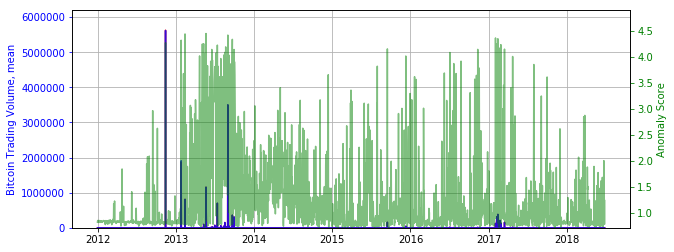

In [66]:
# step 2.2f: Plot the anomaly scores along with some features from the daily std_dev data

fig, ax1 = plt.subplots()
ax2 = ax1.twinx()

#https://matplotlib.org/2.0.2/api/colors_api.html

ax1.plot(df_daily_deltas['Volume_(BTC)_delta_60_mean'], color='r', alpha=0.8)
ax1.plot(df_daily_deltas['Volume_(Currency)_delta_60_mean'], color='b', alpha=0.8)
ax2.plot(df_daily_deltas['score'], color='g', alpha=0.5)

ax1.grid(which='major', axis='both')

ax1.set_ylabel('Bitcoin Trading Volume, mean', color='b')
ax2.set_ylabel('Anomaly Score', color='g')

ax1.tick_params('y', colors='b')
ax2.tick_params('y', colors='g')

ax1.set_ylim(0, 1.1*df_daily_deltas['Volume_(BTC)_delta_60_mean'].max())
ax2.set_ylim(df_daily_deltas['score'].min(), 1.1*df_daily_deltas['score'].max())
fig.set_figwidth(10)
plt.show()

In [67]:
# step 2.2g: Anomalies are defined as scores greater than 3 standard deviations fronm the mean of score.

score_mean = df_daily_deltas['score'].mean()
score_std = df_daily_deltas['score'].std()
score_cutoff = score_mean + 2*score_std
print("Score mean:" + str(score_mean) + ", Score std: " + str(score_std) + "Score cutoff:" + str(score_cutoff))
anomalies = df_daily_deltas[df_daily_deltas['score'] > score_cutoff]
print("At a 2.0 sd threshhold, there are " + str(len(anomalies.score)) + " anomalies.")
anomalies.score

Score mean:1.2333142693386279, Score std: 0.7518210924477419Score cutoff:2.736956454234112
At a 2.0 sd threshhold, there are 162 anomalies.


Date
2012-09-14    2.967133
2012-11-13    4.272862
2013-01-25    4.320181
2013-01-29    3.023565
2013-02-05    3.679787
2013-02-07    3.243140
2013-02-12    4.441382
2013-03-09    3.068120
2013-03-11    3.009668
2013-03-12    3.029838
2013-03-17    2.810016
2013-03-29    2.904926
2013-04-02    3.176644
2013-04-11    2.787042
2013-04-14    2.767982
2013-04-20    2.856003
2013-04-21    4.018879
2013-04-30    3.128671
2013-05-03    2.836524
2013-05-04    4.248380
2013-05-06    4.050144
2013-05-09    3.848241
2013-05-10    4.252777
2013-05-16    2.908187
2013-05-18    4.067966
2013-05-21    4.450001
2013-05-25    3.572416
2013-05-28    3.830526
2013-05-31    3.046056
2013-06-05    3.230241
                ...   
2016-08-24    3.918383
2016-10-06    3.313702
2016-10-27    3.572562
2016-10-28    2.909615
2016-11-04    3.645567
2016-11-10    4.144984
2016-11-16    3.461328
2016-11-17    3.785368
2017-02-01    4.364306
2017-02-06    4.231486
2017-02-07    4.251114
2017-02-09    3.194735
2017-0

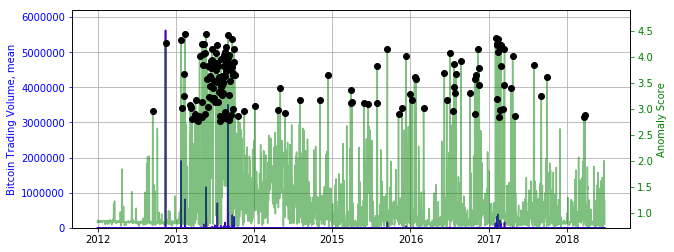

In [68]:
# step 2.2h: Add the anomalies to the plot.

ax2.plot(anomalies.index, anomalies.score, 'ko')
fig


In [69]:
# step 2.2i:
sagemaker.Session().delete_endpoint(rcf_inference.endpoint)

INFO:sagemaker:Deleting endpoint with name: randomcutforest-2018-10-15-04-49-30-918


In [70]:
# step 2.2j: create an anomaly indicator columns
df_daily_deltas['anomalies'] = (df_daily_deltas['score'] > score_cutoff)
# write dataframe to csv locally
df_daily_deltas.to_csv('df_daily_deltas_with_scores_volume_greater_than_1_red_features.csv', index=True, header=True)


In [71]:
df_daily_deltas.columns

Index(['Volume_(BTC)_delta_1_min', 'Volume_(BTC)_delta_1_max',
       'Volume_(BTC)_delta_1_std', 'Volume_(BTC)_delta_1_mean',
       'Volume_(BTC)_delta_30_min', 'Volume_(BTC)_delta_30_max',
       'Volume_(BTC)_delta_30_std', 'Volume_(BTC)_delta_30_mean',
       'Volume_(BTC)_delta_60_min', 'Volume_(BTC)_delta_60_max',
       'Volume_(BTC)_delta_60_std', 'Volume_(BTC)_delta_60_mean',
       'Volume_(Currency)_delta_1_min', 'Volume_(Currency)_delta_1_max',
       'Volume_(Currency)_delta_1_std', 'Volume_(Currency)_delta_1_mean',
       'Volume_(Currency)_delta_30_min', 'Volume_(Currency)_delta_30_max',
       'Volume_(Currency)_delta_30_std', 'Volume_(Currency)_delta_30_mean',
       'Volume_(Currency)_delta_60_min', 'Volume_(Currency)_delta_60_max',
       'Volume_(Currency)_delta_60_std', 'Volume_(Currency)_delta_60_mean',
       'Weighted_Price_delta_1_min', 'Weighted_Price_delta_1_max',
       'Weighted_Price_delta_1_std', 'Weighted_Price_delta_1_mean',
       'Weighted_Price_delt

/home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages/statsmodels/nonparametric/kde.py:488: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
/home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2
/home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages/numpy/core/_methods.py:26: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims)


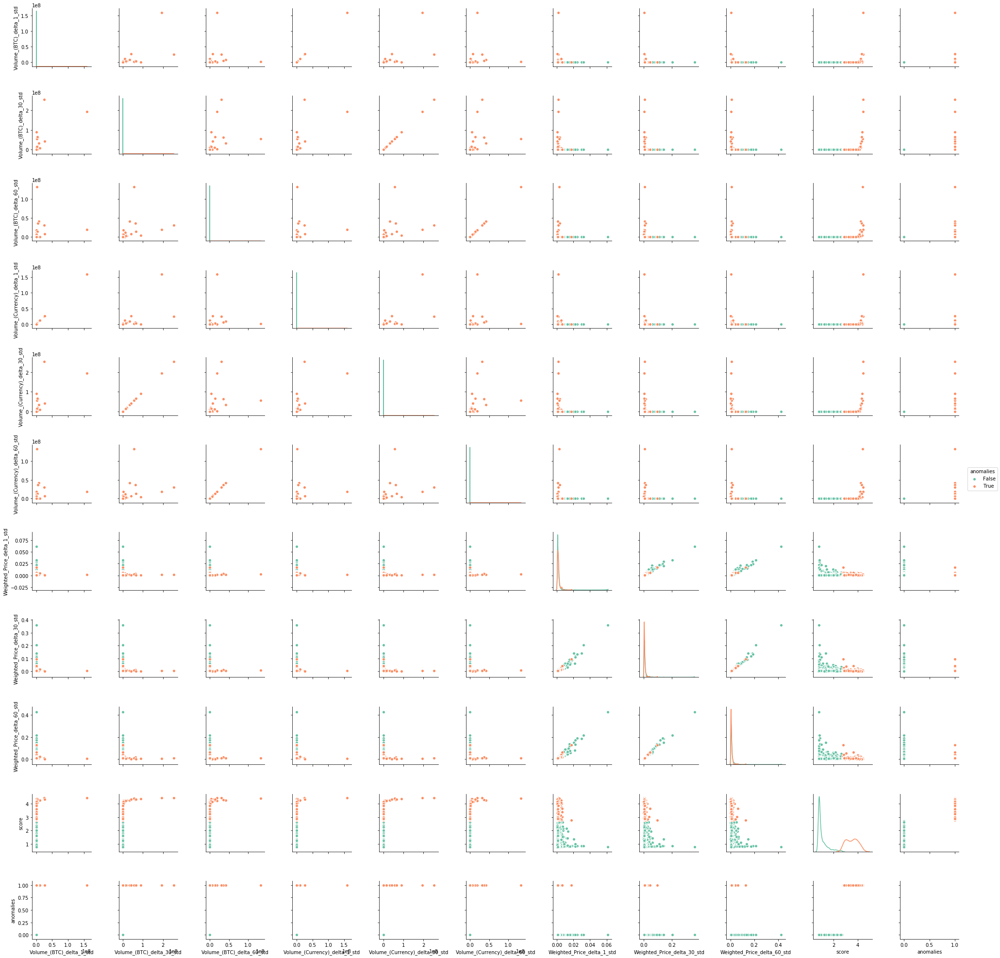

In [72]:
#step 2.2k:  produce a pairwise plot of features. there is a step below that selects a set of feature columns based on a regex search through the column names.
# this can be very slow when including too many features.

std_cols = df_daily_deltas.columns.str.contains('std', regex=True) # pulls in all attributes with column names matching the pattern in contains()
std_cols[36:39] = True # pulls in score and anomalies attributes

g = sns.pairplot(df_daily_deltas.iloc[:, std_cols], hue="anomalies", palette="Set2", diag_kind="kde")
plt.show()

## 2.3  RCF Modeling with df_rolling dataframe

In [73]:
#step 2.3a:  building RCF training job for percentage_deltas model.

session = sagemaker.Session()
# bucket = 'sagemaker-davidrob'
# prefix = 'group-project/bitcoin'
# specify general training job information
rcf = RandomCutForest(role=execution_role,
                      train_instance_count=1,
                      train_instance_type='ml.c5.xlarge',
                      data_location='s3://{}/{}/'.format(bucket, prefix),
                      output_path='s3://{}/{}/output'.format(bucket, prefix),
                      num_samples_per_tree=200,
                      num_trees=200)
# automatically upload the training data to S3 and run the training job

rcf.fit(rcf.record_set(df_rolling.values))

INFO:sagemaker:Creating training-job with name: randomcutforest-2018-10-15-05-00-16-940


2018-10-15 05:00:17 Starting - Starting the training job...
Launching requested ML instances......
Preparing the instances for training......
2018-10-15 05:02:29 Downloading - Downloading input data..
Docker entrypoint called with argument(s): train
[10/15/2018 05:03:00 INFO 140412518692672] Reading default configuration from /opt/amazon/lib/python2.7/site-packages/algorithm/resources/default-conf.json: {u'_ftp_port': 8999, u'num_samples_per_tree': 256, u'_tuning_objective_metric': u'', u'_num_gpus': u'auto', u'_log_level': u'info', u'_kvstore': u'dist_async', u'force_dense': u'true', u'epochs': 1, u'num_trees': 100, u'eval_metrics': [u'accuracy', u'precision_recall_fscore'], u'_num_kv_servers': u'auto', u'mini_batch_size': 1000}
[10/15/2018 05:03:00 INFO 140412518692672] Reading provided configuration from /opt/ml/input/config/hyperparameters.json: {u'mini_batch_size': u'1000', u'feature_dim': u'10', u'num_samples_per_tree': u'200', u'num_trees': u'200'}
[10/15/2018 05:03:00 INFO 1404


2018-10-15 05:02:54 Training - Training image download completed. Training in progress.
2018-10-15 05:03:04 Uploading - Uploading generated training model
2018-10-15 05:03:10 Completed - Training job completed
Billable seconds: 42


In [74]:
# step 2.3b:  spin up endpoint instances for generating anamaly scores for percentage deltas model. 
# At this point, we're just starting the endpoint machines, which takes some time.

rcf_inference = rcf.deploy(
    initial_instance_count=1,
    instance_type='ml.c5.xlarge',
)

INFO:sagemaker:Creating model with name: randomcutforest-2018-10-15-05-03-39-748
INFO:sagemaker:Creating endpoint with name randomcutforest-2018-10-15-05-00-16-940


---------------------------------------------------------------!

In [75]:
# step 2.3c: getting ready to send data to the endpoint so that it will spit out anomaly scores

rcf_inference.content_type = 'text/csv'
rcf_inference.serializer = csv_serializer
rcf_inference.accept = 'application/json'
rcf_inference.deserializer = json_deserializer

In [77]:
# step 2.3d: convert our deltas dataframe to an appropriate matrix format for predicting
df_rolling_numpy = df_rolling.as_matrix()

results = rcf_inference.predict(df_rolling_numpy)
scores = [datum['score'] for datum in results['scores']]

# add scores to daily std_dev dataframe and print first few values
df_rolling['score'] = pd.Series(scores, index=df_rolling.index)
df_rolling['date'] = df_rolling.index
df_rolling.head()

,Weighted_Price,Volume_(BTC),Volume_(Currency),Price30DayRollMean,PriceMinus30DayRollMean,PriceIntraDayDelta,Volume30DayRollMean,VolumeMinus30DayRollMean,Price30DayRollStDev,Volume30DayRollStDev,score,date
Date,,,,,,,,,,,,
2012-01-30,0.000087,0.895920,0.005261,0.000125,-0.000038,-0.000103,1.235937,-0.340017,0.000034,1.105759,1.807661,2012-01-30
2012-01-31,0.000092,0.713636,0.004402,0.000126,-0.000035,0.000006,1.211661,-0.498025,0.000032,1.109071,1.839054,2012-01-31
2012-02-01,0.000090,0.584212,0.003626,0.000127,-0.000038,-0.000082,1.136293,-0.552081,0.000030,1.070381,1.872966,2012-02-01
2012-02-02,0.000117,1.331048,0.008576,0.000129,-0.000012,-0.000097,1.069914,0.261133,0.000028,0.988772,1.812912,2012-02-02
2012-02-03,0.000122,1.068358,0.006989,0.000131,-0.000009,-0.000096,0.964318,0.104040,0.000026,0.787671,1.834598,2012-02-03


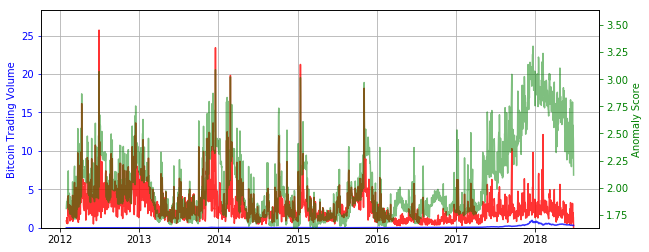

In [78]:
# step 2.3e: Plot the anomaly scores along with some features from the daily std_dev data

fig, ax1 = plt.subplots()
ax2 = ax1.twinx()

ax1.plot(df_rolling['Volume_(BTC)'], color='r', alpha=0.8)
ax1.plot(df_rolling['Weighted_Price'], color='b', alpha=0.8)
ax2.plot(df_rolling['score'], color='g', alpha=0.5)

ax1.grid(which='major', axis='both')

ax1.set_ylabel('Bitcoin Trading Volume', color='b')
ax2.set_ylabel('Anomaly Score', color='g')

ax1.tick_params('y', colors='b')
ax2.tick_params('y', colors='g')

ax1.set_ylim(0, 1.1*df_rolling['Volume_(BTC)'].max())
ax2.set_ylim(df_rolling['score'].min(), 1.1*df_rolling['score'].max())
fig.set_figwidth(10)
plt.show()

In [79]:
# step 2.3f: Anomalies are defined as scores greater than 3 standard deviations fronm the mean of score.

score_mean = df_rolling['score'].mean()
score_std = df_rolling['score'].std()
score_cutoff = score_mean + 2.5*score_std
print("Score mean:" + str(score_mean) + ", Score std: " + str(score_std) + "Score cutoff:" + str(score_cutoff))
anomalies = df_rolling[df_rolling['score'] > score_cutoff]
print("At a 2.5 sd threshhold, there are " + str(len(anomalies.score)) + " anomalies.")
anomalies.score

Score mean:2.042724152278014, Score std: 0.3593310989764886Score cutoff:2.9410518997192354
At a 2.5 sd threshhold, there are 60 anomalies.


Date
2012-06-29    3.069840
2013-12-18    3.088109
2014-02-25    3.020692
2015-01-14    3.015422
2015-11-04    2.969368
2017-09-15    3.044995
2017-11-02    2.944606
2017-11-12    3.024278
2017-11-29    3.134932
2017-11-30    3.030036
2017-12-06    3.029201
2017-12-07    3.151839
2017-12-08    3.155954
2017-12-09    3.017606
2017-12-10    3.045401
2017-12-11    3.055824
2017-12-12    3.005517
2017-12-13    3.070923
2017-12-14    2.994809
2017-12-15    3.114714
2017-12-17    2.946677
2017-12-18    3.061998
2017-12-19    3.155369
2017-12-20    3.230501
2017-12-21    3.112122
2017-12-22    3.304717
2017-12-23    3.108530
2017-12-24    3.030424
2017-12-26    3.008733
2017-12-27    3.022211
2017-12-28    3.012038
2017-12-29    2.958542
2017-12-30    3.074493
2018-01-02    3.004933
2018-01-04    2.996719
2018-01-05    3.042569
2018-01-08    3.031768
2018-01-09    2.973023
2018-01-10    3.042683
2018-01-11    3.050619
2018-01-16    3.204198
2018-01-17    3.190536
2018-01-18    3.038788
2018-0

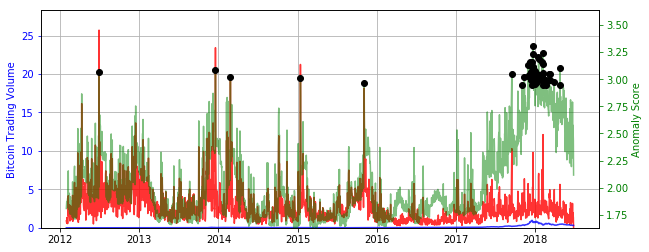

In [80]:
# step 2.3g: Add the anomalies to the plot.

ax2.plot(anomalies.index, anomalies.score, 'ko')
fig

In [81]:
# step 2.3h: 
sagemaker.Session().delete_endpoint(rcf_inference.endpoint)

INFO:sagemaker:Deleting endpoint with name: randomcutforest-2018-10-15-05-00-16-940


In [84]:
# step 2.3i: create an anomaly indicator columns
df_rolling['anomalies'] = (df_rolling['score'] > score_cutoff)
# write dataframe to csv locally
# prefix_result_folder = ''
filename = 'df_rolling_anomaly_scores.csv'
df_rolling.to_csv(path_or_buf = filename,  index=True, header=True)

/home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages/statsmodels/nonparametric/kde.py:488: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
/home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2
/home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages/numpy/core/_methods.py:26: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims)


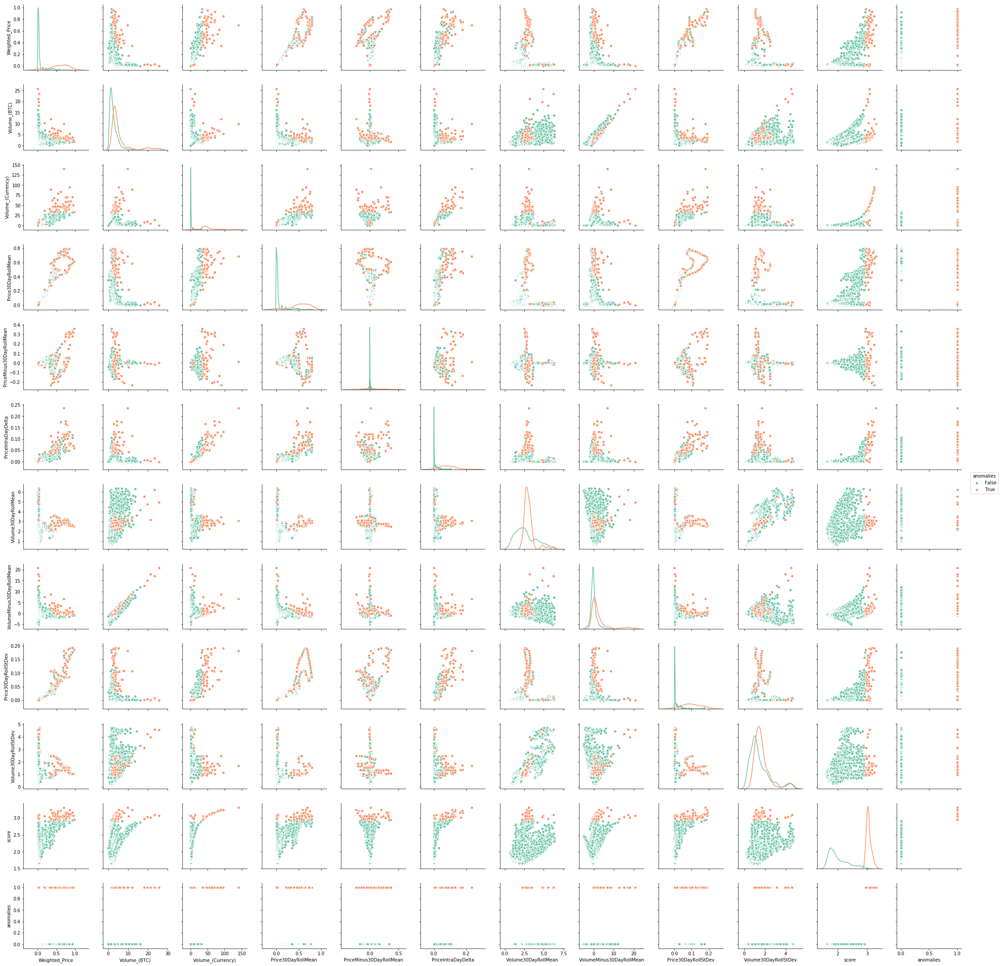

In [85]:
#step 2.3j:  another visualization of the df_rolling anomlaies?
g = sns.pairplot(df_rolling, hue="anomalies", palette="Set2", diag_kind="kde")
plt.show()

### Comparison of Model Results and Mixing Models

As we see below, the Daily and Rolling model scores are closely correlated whereas the Deltas model scores are only slightly (and negatively) correlated to the others.  Without having evidence of known market manipulation events, we suspect that models containing level-based features and those that focus on the proportion of directional change may be relevant to identifying manipulation events.

Models that ignore the level of market activity ignore the fact that a more valuable market with a higher volume of transactions is both a more appealing target for manipulation and a more chaotice setting in which manipulation can take place without being easily observed.  The latter trend may reverse for very large markets in which volume is so high that manipulation by independent actors is less feasible due to capital constraints.

Models that ignore the proportion of directional change are likely to underestimate the prevalence of manipulation events in times when market prices and volumes are at a relatively low level.

We proceed to analyze the characteristics of anomalous events and propose a mixture of two models.

In [86]:
#3.1 - Take find the correlation coefficients between the scores assigned by our models.  
#df_daily = pd.read_csv('./scores/df_daily_anomaly_scores_with_dates.csv')
#df_rolling = pd.read_csv('./scores/df_rolling_anomaly_scores.csv')

#Align the indices because different models are missing different indices.
df_daily_ltd = df_daily.iloc[ df_rolling.index,]
df_deltas_ltd = df_daily_deltas.iloc[df_rolling.index, ]
print(np.corrcoef(df_daily_ltd['score'], df_rolling['score']))
print(np.corrcoef(df_deltas_ltd['score'], df_rolling['score']))
print(np.corrcoef(df_deltas_ltd['score'], df_daily_ltd['score']))


TypeError: invalid type promotion

#### Anomalous Activity Analysis

Within the Rolling averages model results, we see that high anomaly scores are strongly associated with high levels of USD trading volume on the exchange indicating a "hot" market. This trend is echoed in the pairplot results that follow for the daily OHCLV level model, and further confirm that there is little need to watch both feature sets.  

In [87]:
#score_mean = df_rolling['score'].mean()
#score_std = df_rolling['score'].std()
#score_cutoff = score_mean + 2*score_std
#print("Score mean:" + str(score_mean) + ", Score std: " + str(score_std) + "Score cutoff:" + str(score_cutoff))
#anomalies = df_rolling[df_rolling['score'] > score_cutoff]
#print("At a 2.5 sd threshhold, there are " + str(len(anomalies.score)) + " anomalies.")
#df_rolling['anomalies'] = df_rolling['anomalies'].replace({True: "anomaly", False: "non-anomaly"})
#df_rolling['post_Nov_2013'] = (df_rolling['date'] > '2013-11-20')
#df_rolling['post_Nov_2013'] = df_rolling['post_Nov_2013'].replace({True: "post_Nov_2013", False: "pre_Nov_2013"})

#3.2
#Create a new "year" indicator for the purpose of visualizing how our attributes vary over time in the pairplot below
df_rolling['Year'] = df_rolling['Date'].str.slice(0,4)
df_rolling['cat'] = df_rolling[['anomalies', 'Year']].apply(lambda x: ','.join(x), axis = 1)
pre_2017 = (df_rolling['Year'] != "2017") & (df_rolling['Year'] != "2018")
g = sns.pairplot(df_rolling.loc[pre_2017], hue="Year", palette="Set2", diag_kind="kde")

plt.show()

KeyError: 'Date'

Index(['Date', 'Open_min', 'Open_max', 'Open_std', 'Open_mean', 'High_min',
       'High_max', 'High_std', 'High_mean', 'Low_min', 'Low_max', 'Low_std',
       'Low_mean', 'Close_min', 'Close_max', 'Close_std', 'Close_mean',
       'Vol_BTC_min', 'Vol_BTC_max', 'Vol_BTC_std', 'Vol_BTC_mean',
       'Vol_Currency_min', 'Vol_Currency_max', 'Vol_Currency_std',
       'Vol_Currency_mean', 'Wt_Price_min', 'Wt_Price_max', 'Wt_Price_std',
       'Wt_Price_mean', 'score', 'date', 'Date.1', 'anomalies',
       'post_Nov_2013', 'cat'],
      dtype='object')


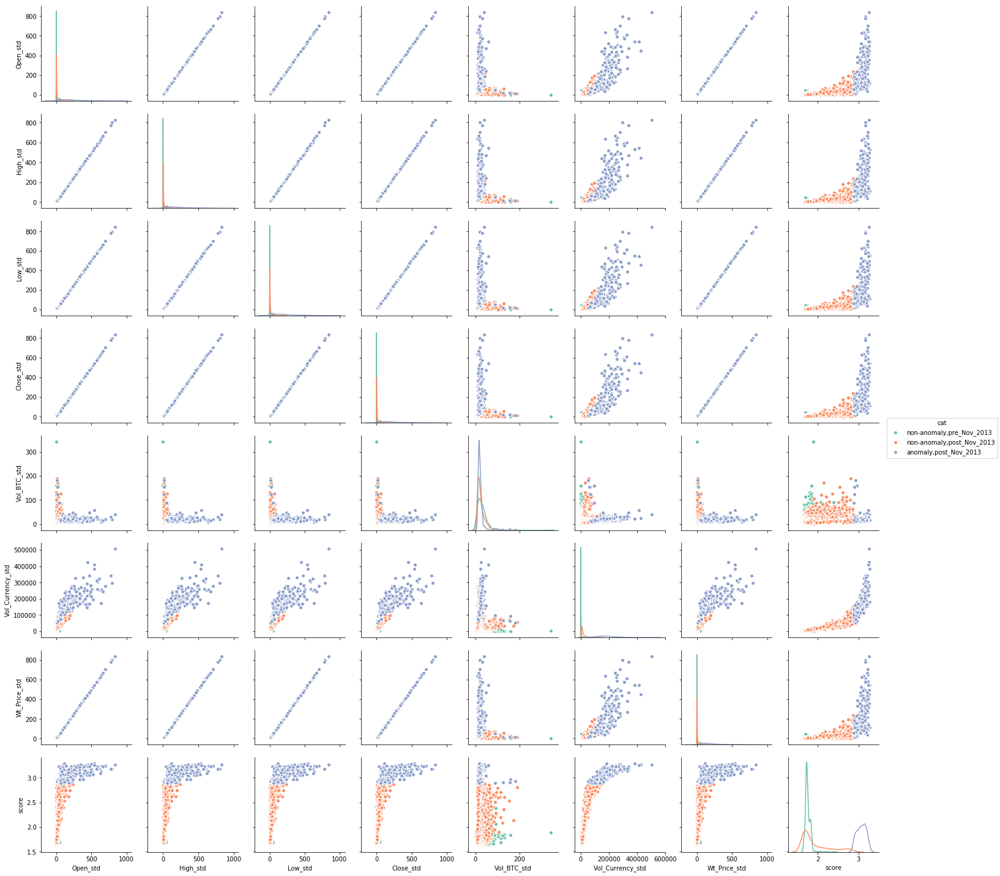

In [79]:
#3.3 Similar to above, but for df_daily scores

score_mean = df_daily['score'].mean()
score_std = df_daily['score'].std()
score_cutoff = score_mean + 2*score_std
#print("Score mean:" + str(score_mean) + ", Score std: " + str(score_std) + "Score cutoff:" + str(score_cutoff))
df_daily['anomalies'] = (df_daily['score'] > score_cutoff)
#print("At a 2.5 sd threshhold, there are " + str(len(anomalies.score)) + " anomalies.")
df_daily['anomalies'] = df_daily['anomalies'].replace({True: "anomaly", False: "non-anomaly"})
df_daily['post_Nov_2013'] = (df_daily['date'] > '2013-11-20')
df_daily['post_Nov_2013'] = df_daily['post_Nov_2013'].replace({True: "post_Nov_2013", False: "pre_Nov_2013"})
print(df_daily.columns)
df_daily['cat'] = df_daily[['anomalies', 'post_Nov_2013']].apply(lambda x: ','.join(x), axis = 1)

#plotting all columns is very slow. let's focus on the standard deviation features.
mean_cols = df_daily.columns.str.contains('std', regex=True) # pulls in all attributes with column names matching the pattern in contains()
mean_cols[29] = True #add the score feature (not located using the function above)
mean_cols[34] = True # add the "cat" feature we created above
g = sns.pairplot(df_daily.iloc[:, mean_cols], hue="cat", palette="Set2", diag_kind="kde")
plt.show()

/home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages/numpy/core/_methods.py:135: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages/numpy/core/_methods.py:127: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages/numpy/core/_methods.py:26: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims)


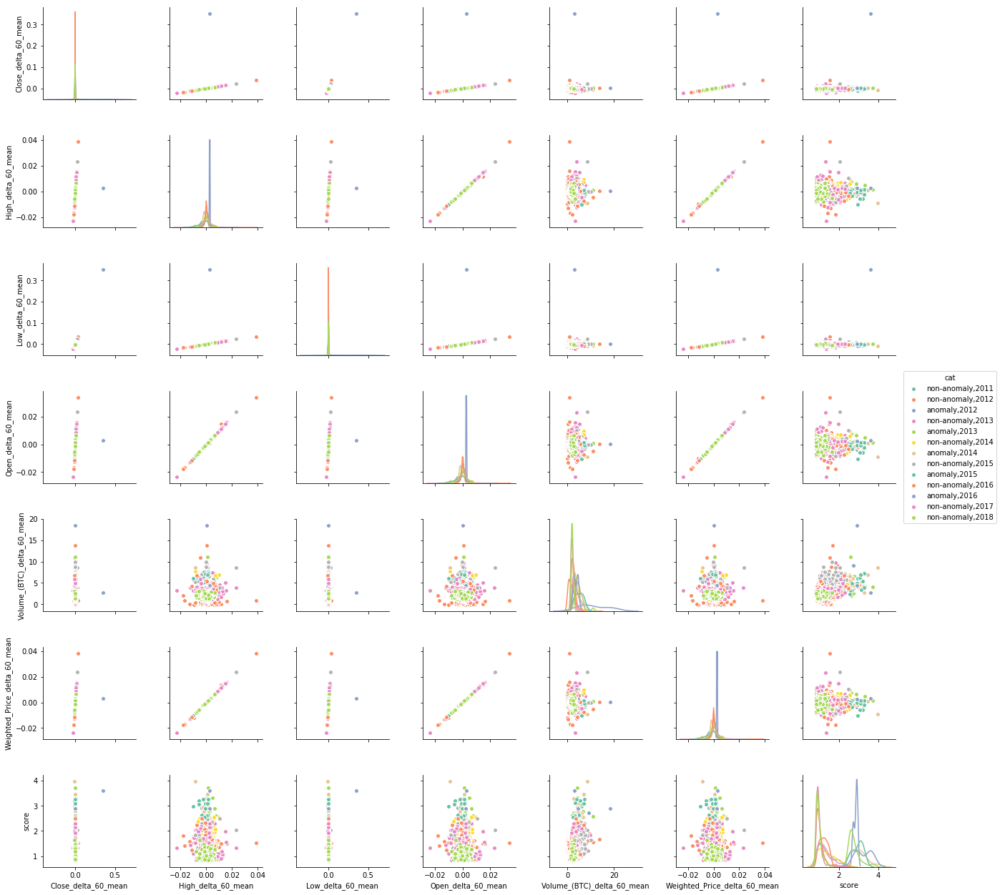

In [126]:
#3.3 similar to above, but for the deltas model results.
score_mean = df_deltas['score'].mean()
score_std = df_deltas['score'].std()
score_cutoff = score_mean + 2*score_std
#print("Score mean:" + str(score_mean) + ", Score std: " + str(score_std) + "Score cutoff:" + str(score_cutoff))
#anomalies = df_rolling[df_rolling['score'] > score_cutoff]
#print("At a 2.5 sd threshhold, there are " + str(len(anomalies.score)) + " anomalies.")
df_deltas['anomalies'] = df_deltas['anomalies'].replace({True: "anomaly", False: "non-anomaly"})
#df_deltas['post_Nov_2013'] = (df_rolling['date'] > '2013-11-20')
#df_rolling['post_Nov_2013'] = df_rolling['post_Nov_2013'].replace({True: "post_Nov_2013", False: "pre_Nov_2013"})
print
df_deltas['Year'] = df_deltas['Date'].str.slice(0,4)
df_deltas['cat'] = df_deltas[['anomalies', 'Year']].apply(lambda x: ','.join(x), axis = 1)
sixty_cols = df_deltas.columns.str.contains('60_mean', regex=True) # pulls in all attributes with column names matching the pattern in contains()
sixty_cols[77] = True # pulls in score attribute
sixty_cols[73] = True # pulls in anomaly attribute
#print(sixty_cols)
#pre_2017 = (df_deltas['Year'] != "2017") & (df_rolling['Year'] != "2018")
g = sns.pairplot(df_deltas.iloc[:,sixty_cols], hue="cat", palette="Set2", diag_kind="kde")

plt.show()

In [155]:
#3.4 merge df_rolling and df_deltas
df_rolling = df_rolling.rename(index=str, columns={"score": "rolling_score"})
df_deltas_ltd = df_deltas_ltd.rename(index=str, columns={"score": "deltas_score"})
# I loaded the df_rolling results from csv, but I made changes above that may invalidate this step when 
# walking through this workbook in its current state to obtain new scores for the model
df_rolling['date'] = df_rolling['date'].astype('datetime64[D]')
df_agg_model = df_rolling.merge(df_deltas_ltd, on = 'date')
# average the scores for the two models.
df_agg_model['merged_score'] = (df_agg_model['deltas_score'] + df_agg_model['rolling_score']) / 2

TypeError: cannot astype a datetimelike from [datetime64[ns]] to [datetime64[D]]

In [156]:
df_agg_model.describe()

,Weighted_Price,Volume_(BTC),Volume_(Currency),Price30DayRollMean,PriceMinus30DayRollMean,PriceIntraDayDelta,Volume30DayRollMean,VolumeMinus30DayRollMean,Price30DayRollStDev,Volume30DayRollStDev,...,Weighted_Price_delta_30_min,Weighted_Price_delta_30_max,Weighted_Price_delta_30_std,Weighted_Price_delta_30_mean,Weighted_Price_delta_60_min,Weighted_Price_delta_60_max,Weighted_Price_delta_60_std,Weighted_Price_delta_60_mean,deltas_score,merged_score
count,2309.000000,2309.000000,2.309000e+03,2309.000000,2309.000000,2309.000000,2309.000000,2309.000000,2309.000000,2309.000000,...,2309.000000,2309.000000,2309.000000,2309.000000,2309.000000,2309.000000,2309.000000,2309.000000,2309.000000,2309.000000
mean,1489.082854,16060.015443,2.195212e+07,1438.172718,50.910136,125.796466,16038.616434,21.399009,174.527893,8587.085202,...,-0.025709,0.026013,0.007337,0.000158,-0.029179,0.029833,0.009604,0.000301,1.276112,1.672298
std,3009.633509,12784.500516,5.389650e+07,2926.062975,681.420568,357.296765,7789.548221,10662.034739,454.027739,5741.797656,...,0.028020,0.037613,0.007268,0.001322,0.033135,0.036219,0.009132,0.002612,0.418864,0.303952
min,4.328903,1607.018144,1.527717e+04,4.860887,-4630.669583,0.010000,3771.917757,-29968.653542,0.055375,1109.385719,...,-0.485647,0.000000,0.000465,-0.012231,-0.606238,0.000000,0.000657,-0.023717,0.866541,1.261762
25%,125.761585,7907.470553,1.474576e+06,120.212017,-12.512233,4.760000,10230.580777,-5257.907872,7.178999,4922.719221,...,-0.030000,0.011167,0.003800,-0.000376,-0.034115,0.012997,0.004856,-0.000749,0.994031,1.424190
50%,416.675809,12444.875494,3.822011e+06,414.615902,1.485082,14.000000,14816.086209,-1531.130310,22.480457,6872.208863,...,-0.018397,0.018287,0.005783,0.000115,-0.020738,0.021292,0.007471,0.000228,1.122580,1.587397
75%,791.694130,20377.789322,1.062743e+07,761.586279,31.165845,50.980000,21674.378078,2840.174132,74.222392,10917.821539,...,-0.011637,0.029856,0.008695,0.000729,-0.012715,0.035308,0.011551,0.001422,1.395492,1.903294
max,19186.169610,150486.862335,7.721535e+08,15637.654327,7150.853614,4635.680000,37411.222268,121558.680468,3792.771834,27824.197147,...,0.000000,0.897698,0.160295,0.013662,0.000000,0.624245,0.166030,0.023468,3.986525,3.293817


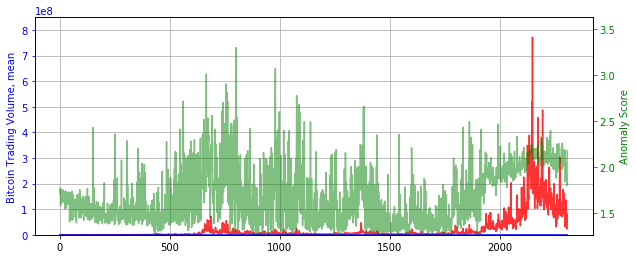

In [157]:

fig, ax1 = plt.subplots()
ax2 = ax1.twinx()

#https://matplotlib.org/2.0.2/api/colors_api.html

ax1.plot(df_agg_model['Volume_(Currency)'], color='r', alpha=0.8)
ax1.plot(df_agg_model['Weighted_Price_delta_60_std'], color='b', alpha=0.8)
ax2.plot(df_agg_model['merged_score'], color='g', alpha=0.5)

ax1.grid(which='major', axis='both')

ax1.set_ylabel('Bitcoin Trading Volume, mean', color='b')
ax2.set_ylabel('Anomaly Score', color='g')

ax1.tick_params('y', colors='b')
ax2.tick_params('y', colors='g')

ax1.set_ylim(0, 1.1*df_agg_model['Volume_(Currency)'].max())
ax2.set_ylim(df_agg_model['merged_score'].min(), 1.1*df_agg_model['merged_score'].max())
fig.set_figwidth(10)
plt.show()

Score mean:1.6722980471453486, Score std: 0.30395220636225834Score cutoff:2.2802024598698654
At a 2 sd threshhold, there are 486 anomalies.


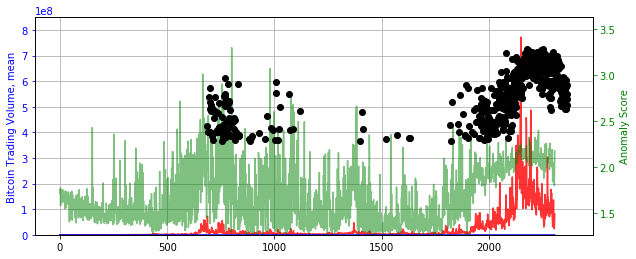

In [158]:

score_mean = df_agg_model['merged_score'].mean()
score_std = df_agg_model['merged_score'].std()
score_cutoff = score_mean + 2*score_std
print("Score mean:" + str(score_mean) + ", Score std: " + str(score_std) + "Score cutoff:" + str(score_cutoff))
anomalies = df_daily[df_daily['score'] > score_cutoff]
print("At a 2 sd threshhold, there are " + str(len(anomalies.score)) + " anomalies.")

ax2.plot(anomalies.index, anomalies.score, 'ko')
fig

### Bitcoin news search


In [1]:
import datetime as dt
import pandas as pd
import requests
pd.set_option('display.max_colwidth', -1)

def get_news_by_date(date, category):
    datefrom = date.strftime("%s")
    dateto = (date + dt.timedelta(days=1)).strftime("%s")
    url = "https://min-api.cryptocompare.com/data/v2/news/?categories=" + \
    category + "&lTs=" + dateto
    f = requests.get(url)
    ipdata = f.json()
    df = pd.DataFrame(ipdata['Data'])
    df = df[(df['published_on'] >= int(datefrom)) & (df['published_on'] < int(dateto))]
    df['published_on'] = df['published_on'].astype(int)
    df['published_on'] = pd.to_datetime(df['published_on'],unit='s')
    df = df[['published_on', 'categories', 'title' \
#              , 'body' \
            ]]
    df.sort_index
    return df

In [2]:
date = dt.datetime(2018,1,1) 
category = "BTC,Marketing, Trading, Regulation"
df_news = get_news_by_date(date, category)
df_news

,published_on,categories,title
0,2018-01-01 23:08:17,BTC|Trading,Bitcoin Adoption by Businesses in 2017
1,2018-01-01 19:30:58,BTC|Asia,"Bitcoin ‘Adds 0.3%’ To Japan’s GDP, Claim Nomura Analysts"
2,2018-01-01 19:29:36,BTC|ETH|Mining|Trading|Technology,Public Firm Faces Class Action Lawsuit for Falsely Claiming Link to Bitcoin
3,2018-01-01 18:42:54,BTC|Mining,"NiceHash CEO Quits After 4,000 BTC Hack, Service To Continue Work"
4,2018-01-01 18:30:43,BTC|Regulation|Sponsored,PR: Gambling Affiliate Site Bonus.ca Joins the Bitcoin Community
5,2018-01-01 18:30:27,BTC|Blockchain|Technology,Propy’s new launch: It is now possible to Buy properties in the US for Bitcoin
6,2018-01-01 17:55:29,BTC|Exchange|Trading|Altcoin,Localbitcoincash.org Plans to Add Zero-Fee BCH-Based ‘Shapeshifting’ Trades
7,2018-01-01 16:30:12,BTC|Market|ETH|Altcoin,After Ripple’s Rise BTC Dominance Falls Below 40%
8,2018-01-01 15:30:43,BTC|LTC|Blockchain|ICO,Video: Bitcoin or Litecoin? Charlie Lee on Which Crypto Had a Better 2017
9,2018-01-01 15:30:43,BTC|Fiat|Trading|Sponsored,"Bitcoin, Why You Should Own a Bit"


### Summary
Place holder for description